<a href="https://colab.research.google.com/github/ZakeC1/MathsProject/blob/main/LexicalGraphAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Cairo Initialise 

In [ ]:
!echo "deb http://downloads.skewed.de/apt focal main" >> /etc/apt/sources.list
!apt-key adv --keyserver keyserver.ubuntu.com --recv-key 612DEFB798507F25
!apt-get update
!apt-get install python3-graph-tool python3-matplotlib python3-cairo

Executing: /tmp/apt-key-gpghome.SSXp2NdDwT/gpg.1.sh --keyserver keyserver.ubuntu.com --recv-key 612DEFB798507F25
gpg: key 612DEFB798507F25: public key "Tiago de Paula Peixoto <tiago@skewed.de>" imported
gpg: Total number processed: 1
gpg:               imported: 1
Get:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease [1,581 B]
Hit:3 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  Packages [993 kB]
Get:5 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Hit:6 http://archive.ubuntu.com/ubuntu focal InRelease
Get:7 http://downloads.skewed.de/apt focal InRelease [7,536 B]
Get:8 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Hit:9 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Hit:10 http://ppa.launchpad.net/deadsnakes

In [ ]:
!apt purge python3-cairo
!apt install libcairo2-dev pkg-config python3-dev
!pip install --force-reinstall pycairo
!pip install zstandard


Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following packages will be REMOVED:
  python3-cairo*
0 upgraded, 0 newly installed, 1 to remove and 26 not upgraded.
After this operation, 270 kB disk space will be freed.
(Reading database ... 125776 files and directories currently installed.)
Removing python3-cairo:amd64 (1.16.2-2ubuntu2) ...
Reading package lists... Done
Building dependency tree       
Reading state information... Done
pkg-config is already the newest version (0.29.1-0ubuntu4).
python3-dev is already the newest version (3.8.2-0ubuntu2).
python3-dev set to manually installed.
The following additional packages will be installed:
  libblkid-dev libcairo-script-interpreter2 libffi-dev libglib2.0-dev
  libglib2.0-dev-bin liblzo2-2 libmount-dev libpixman-1-dev libselinux1-dev
  libsepol1-dev libxcb-render0-dev libxcb-shm0-dev
Suggested packages:
  libcairo2-doc libgirepository1.0-dev libglib2.0-doc libgdk-pixbuf2.0-bin
  | 

# Alternative Conda Initialisation

In [ ]:
#Install Miniconda

%%time
%%capture


import sys


# unset pythonpath env var before installing conda
!usnet PYTHONPATH=


# download and install miniconda for this particular version of python
!wget https://repo.anaconda.com/miniconda/Miniconda3-py38_22.11.1-1-Linux-x86_64.sh
!bash Miniconda3-py38_22.11.1-1-Linux-x86_64.sh -b -f -p /usr/local
!conda install --channel defaults conda python=3.8.15 --yes
!conda update --channel defaults --all --yes
!conda update --name base conda --yes


# append to `sys.path`
sys.path.append("/usr/local/lib/python3.8/site-packages")

CPU times: user 380 ms, sys: 81 ms, total: 461 ms
Wall time: 1min 1s


In [ ]:
#Install Graph-Tools library

%%time
%%capture

!conda install -c conda-forge -c flyem-forge scikit-learn graph-tool pygobject cairo gtk3

# Start Test

In [ ]:
%matplotlib inline

In [ ]:
from graph_tool.all import *

g = collection.data["celegansneural"]
state = minimize_nested_blockmodel_dl(g)

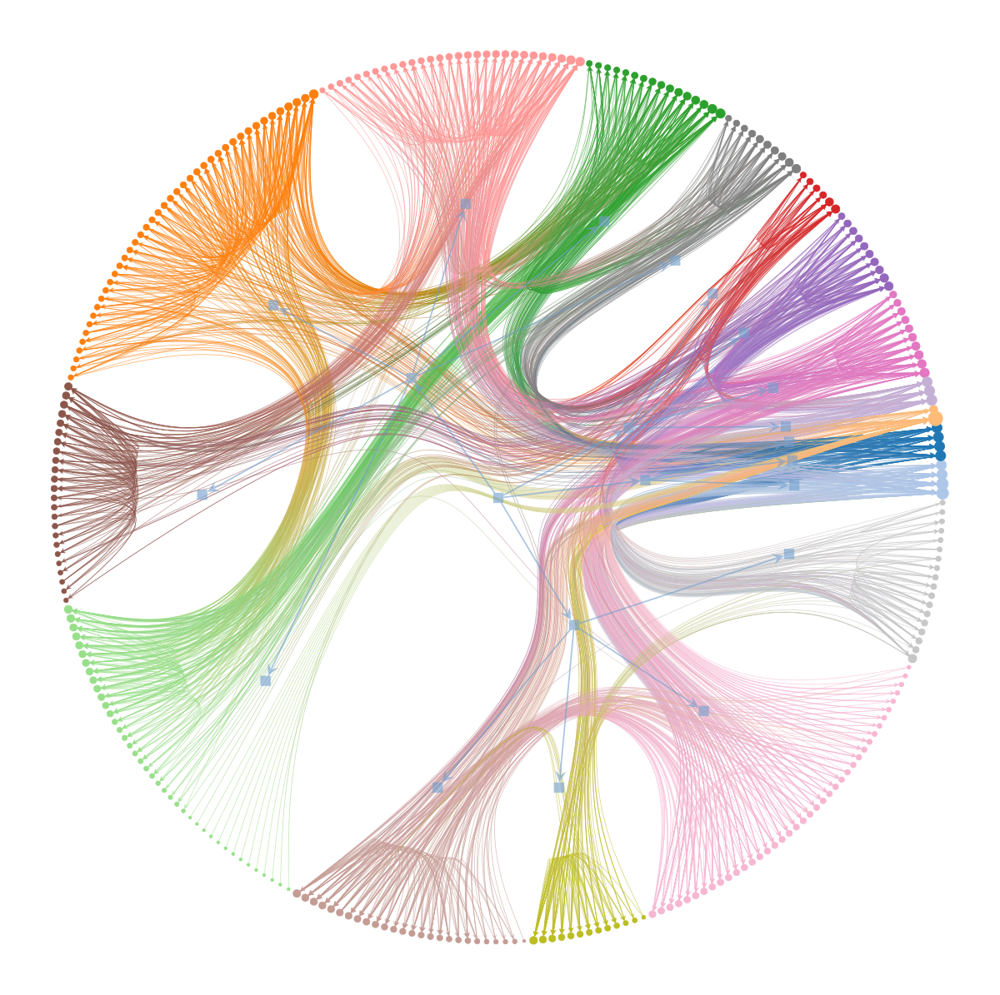

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f796009b0d0, at 0x7f7911cd93d0>,
 <GraphView object, directed, with 319 vertices and 318 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7f7910cd13a0, at 0x7f7910cd4790>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7f7910cd13a0, at 0x7f791f6b4c10>, False), at 0x7f7910cd13a0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f7910cd13a0, at 0x7f792048c400>)

In [ ]:
state.draw()

# Making a graph from an array

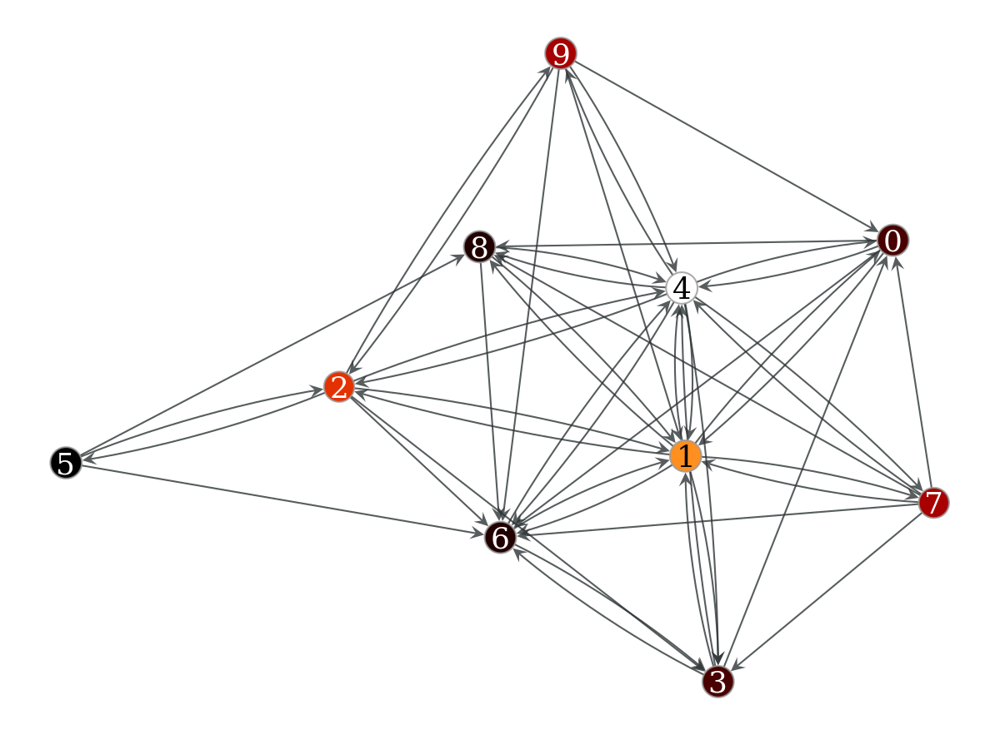

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f9c28092190, at 0x7f9c280a47f0>

In [ ]:
from graph_tool.all import *
import matplotlib
import numpy as np
 
knoki = [ [ 0, 1, 0, 0, 1, 0, 1, 0, 1, 0 ]
        , [ 1, 0, 1, 1, 1, 0, 1, 1, 1, 0 ]
        , [ 0, 1, 0, 1, 1, 1, 1, 0, 0, 1 ]
        , [ 1, 1, 0, 0, 1, 0, 1, 0, 0, 0 ]
        , [ 1, 1, 1, 1, 0, 0, 1, 1, 1, 1 ]
        , [ 0, 0, 1, 0, 0, 0, 1, 0, 1, 0 ]
        , [ 0, 1, 0, 1, 1, 0, 0, 0, 0, 0 ]
        , [ 1, 1, 0, 1, 1, 0, 1, 0, 1, 0 ]
        , [ 0, 1, 0, 0, 1, 0, 1, 0, 0, 0 ]
        , [ 1, 1, 1, 0, 1, 0, 1, 0, 0, 0 ] ]

N = len( knoki )
g = Graph()
g.set_directed( True )
v = [ g.add_vertex() for i in range(N) ]
for i in range(N):
    for j in range(N):
        if knoki[i][j] == 1:
            g.add_edge( v[i], v[j] )

g = GraphView( g, vfilt=label_largest_component(g) )
c = closeness( g )
graph_draw( g, vertex_fill_color=c,
               vertex_size=prop_to_size(c, mi=5, ma=15),
               vcmap=matplotlib.cm.gist_heat,
               vorder=c,
               vertex_text=g.vertex_index,
               vertex_font_size=18 )

# Basic Trophic coherence + other properties

[[16. -2. -2. ... -2.  0.  0.]
 [-2.  9. -2. ...  0.  0.  0.]
 [-2. -2. 10. ...  0. -2.  0.]
 ...
 [-2.  0.  0. ...  6. -2. -2.]
 [ 0.  0. -2. ... -2. 12. -2.]
 [ 0.  0.  0. ... -2. -2. 16.]]


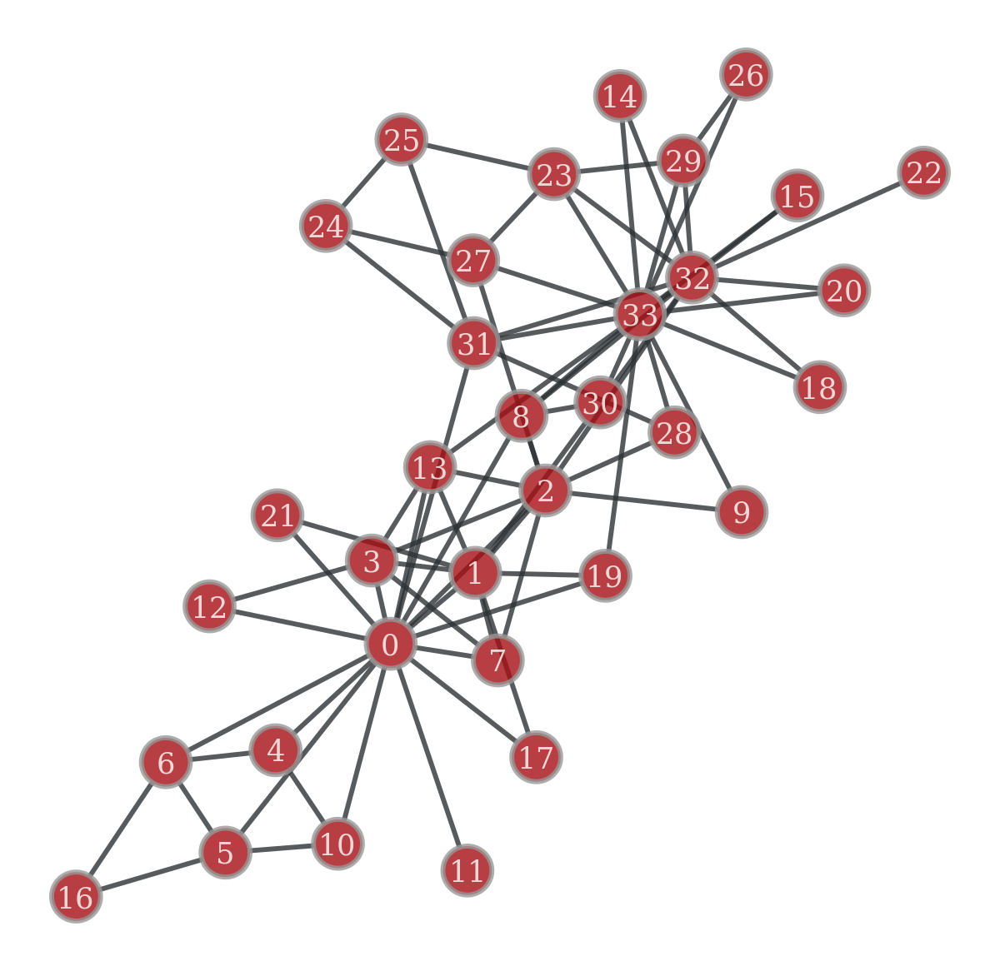

[ 0.          2.12094015  2.30804964  2.53039414  1.          2.
  2.          2.47969196  1.02851103  2.22893206  1.         -1.
  1.53039414  2.15210654  0.45900156  0.45900156  3.          1.12094015
  0.45900156  1.02788172  0.45900156  1.12094015  0.07623827  0.73415591
  1.44596889  1.05781988  0.03492233  1.70452843  1.75702472  0.1140399
  1.30422637  0.90660502  0.53811913  0.92088243]


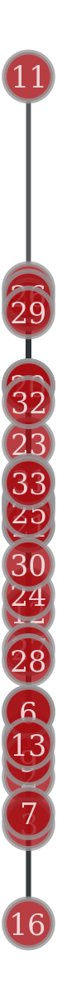

0.4376458032708032
0.053873556998557004
0.15226370851370857
0.01196188071188071
0.0006313131313131313
0.02998737373737374
0.02998737373737374
0.0
0.056737012987012996
0.0008477633477633477
0.0006313131313131313
0.0
0.0
0.041591510341510325
0.0
0.0
0.0
0.0
0.0
0.02936056998556999
0.0
0.0
0.0
0.01824494949494949
0.0022095959595959595
0.0038404882154882154
0.0
0.021702140452140452
0.0017947330447330447
0.0038690476190476187
0.01472763347763348
0.14034842472342468
0.18215788840788844
0.2750556156806156


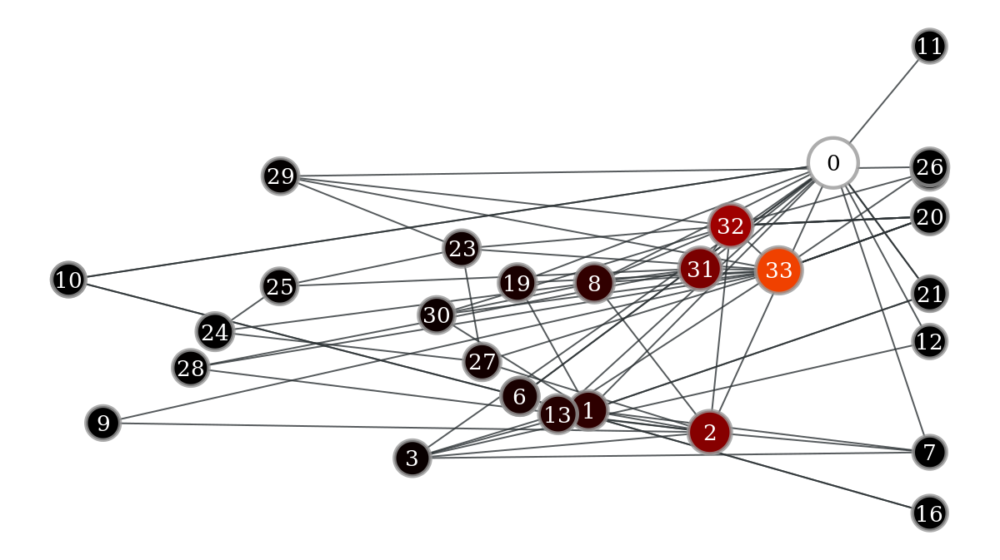

0.15
0.3333333333333333
0.24444444444444444
0.6666666666666666
0.6666666666666666
0.5
0.5
1.0
0.5
0.0
0.6666666666666666
0.0
1.0
0.6
1.0
1.0
1.0
1.0
1.0
0.3333333333333333
1.0
1.0
0.0
0.4
0.3333333333333333
0.3333333333333333
1.0
0.16666666666666666
0.3333333333333333
0.6666666666666666
0.5
0.2
0.18181818181818182
0.11666666666666667


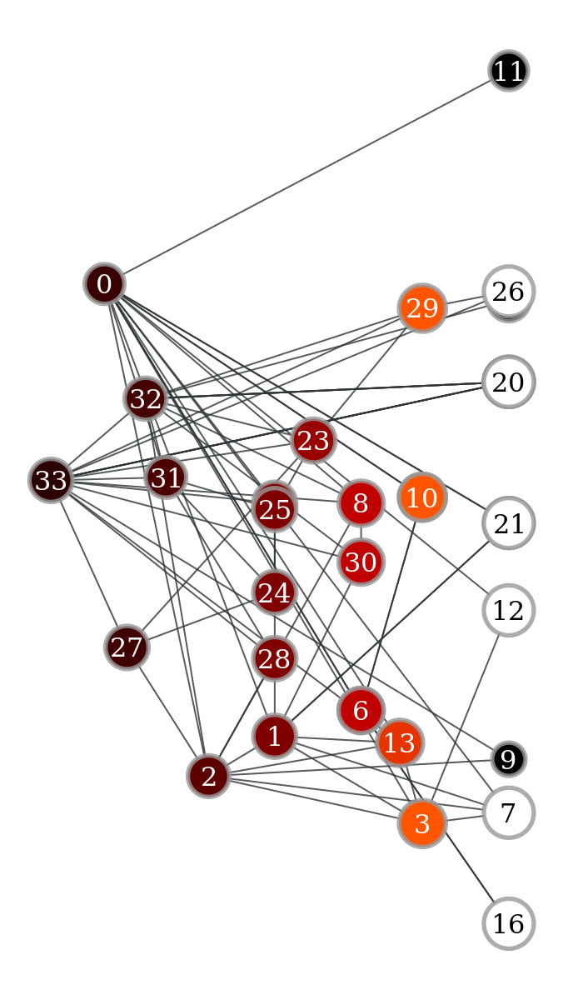

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fcf6b5f4fa0, at 0x7fcf6b51da00>

In [ ]:
from graph_tool.inference.util import float16
from graph_tool.all import *
import math
import matplotlib
import numpy as np
from scipy import sparse
from scipy.linalg import lu_factor, lu_solve
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import inv

#g = collection.ns["cs_department"]
g = collection.ns["karate/77"]
#g = collection.ns["law_firm"]
#g = collection.ns["adjnoun"]

adj = [ [ 1, 0, 1]
        , [ 1, 0, 1]
        , [ 1, 1, 0]]

#N = len(adj)
#g = Graph()
#g.set_directed( True )
#v = [ g.add_vertex() for i in range(N) ]
#for i in range(N):
#    for j in range(N):
#        if adj[i][j] != 0:
#            g.add_edge( v[i], v[j] )

#edges = g2.get_edges()
#in_degs = g2.get_in_degrees(g2.get_vertices())
#out_degs = g2.get_out_degrees(g2.get_vertices())
#print((out_degs[edges[:,0]] * in_degs[edges[:,1]]).sum())

#print(graph_tool.spectral.adjacency(g, weight=None, vindex=None, operator=False, csr=True).toarray())
#print(graph_tool.spectral.laplacian(g, operator=False, csr=True).toarray())

in_degs = (g.get_in_degrees(g.get_vertices()))
out_degs = (g.get_out_degrees(g.get_vertices()))
imbalance = np.array(in_degs.astype(float) - out_degs.astype(float))
strength = in_degs + out_degs
adjacency = graph_tool.spectral.adjacency(g, weight=None, vindex=None, operator=False, csr=True).transpose()

laplacian = np.diag(strength) - (adjacency + adjacency.transpose())
print(laplacian)
graph_draw(g, vertex_text=g.vertex_index)

remLapl = np.delete((np.delete(laplacian, (0), axis=0)), (0), axis=1)
remImb = np.delete(imbalance, (0), axis=0)

lu, piv = lu_factor(remLapl)
h = lu_solve((lu, piv), remImb)
h2 = np.insert(h, 0, 0, axis=0)
print(h2)

pos = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos[g.vertex(i)] = (0, h2[i])

graph_draw(g, pos=pos, vertex_text=g.vertex_index)

vp, ep = graph_tool.centrality.betweenness(g)

for i in range(len(g.get_vertices())):
    if vp[i] == 0:
      pos[g.vertex(i)] = (vp[i], h2[i])
    else:
      pos[g.vertex(i)] = (np.log(vp[i]), h2[i])
    print(vp[i])


#name = g.vertex_properties["label"]
#print(name[0])
graph_draw(g, pos=pos, vertex_text=g.vertex_index, vertex_fill_color=vp, vertex_size=prop_to_size(vp, mi=20, ma=30),
              edge_pen_width=prop_to_size(ep, mi=1, ma=1),
              vcmap=matplotlib.cm.gist_heat)


lc = local_clustering(g)
for i in range(len(g.get_vertices())):
    if lc[i] == 0:
      pos[g.vertex(i)] = (lc[i], h2[i])
    else:
      pos[g.vertex(i)] = (np.log(lc[i]), h2[i])
    print(lc[i])

graph_draw(g, pos=pos, vertex_text=g.vertex_index, vertex_fill_color=lc, vertex_size=prop_to_size(lc, mi=20, ma=30),
              edge_pen_width=prop_to_size(ep, mi=1, ma=1),
              vcmap=matplotlib.cm.gist_heat)

#For Planar Graphs Only
#pos = planar_layout(g)
#graph_draw(g, pos=pos)

# Subplots Example

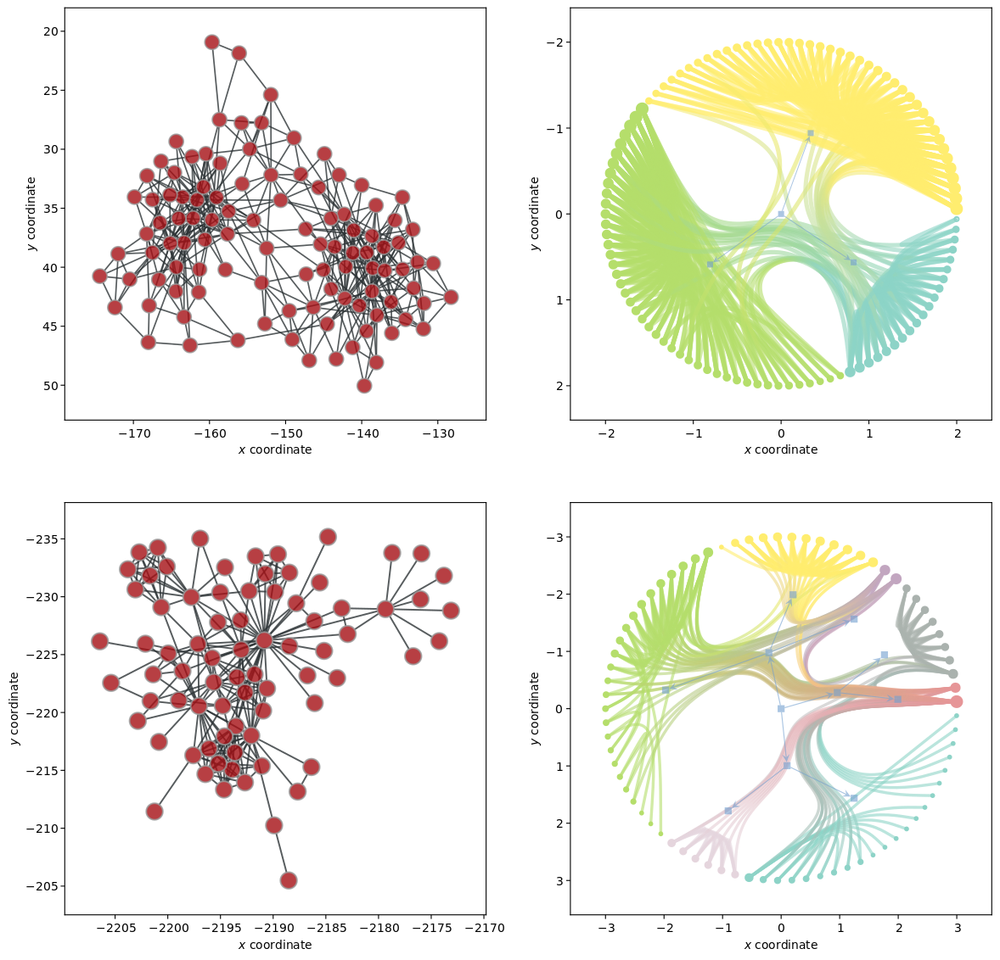

In [ ]:
import graph_tool.all as gt
import matplotlib.pyplot as plt
%matplotlib inline

plt.switch_backend("cairo")

fig, ax = plt.subplots(2, 2, figsize=(12, 11.5))

g = gt.collection.data["polbooks"]

gt.graph_draw(g, g.vp.pos, vertex_size=1.5, mplfig=ax[0,0])

ax[0,0].set_xlabel("$x$ coordinate")
ax[0,0].set_ylabel("$y$ coordinate")

state = gt.minimize_nested_blockmodel_dl(g)

state.draw(mplfig=ax[0,1])

ax[0,1].set_xlabel("$x$ coordinate")
ax[0,1].set_ylabel("$y$ coordinate")

g = gt.collection.data["lesmis"]
gt.graph_draw(g, g.vp.pos, vertex_size=1.5, mplfig=ax[1,0])

ax[1,0].set_xlabel("$x$ coordinate")
ax[1,0].set_ylabel("$y$ coordinate")

state = gt.minimize_nested_blockmodel_dl(g)

state.draw(mplfig=ax[1,1])

ax[1,1].set_xlabel("$x$ coordinate")
ax[1,1].set_ylabel("$y$ coordinate")

plt.subplots_adjust(left=0.08, right=0.99, top=0.99, bottom=0.06)
%matplotlib inline
plt.show()

<ipython-input-7-b6220c2a8962>:11: DeprecationWarning: The module `scipy.sparse.linalg.dsolve.linsolve` is deprecated. All public names must be imported directly from the `scipy.sparse.linalg` namespace.
  from scipy.sparse.linalg.dsolve import linsolve


[[16. -2. -2. ... -2.  0.  0.]
 [-2.  9. -2. ...  0.  0.  0.]
 [-2. -2. 10. ...  0. -2.  0.]
 ...
 [-2.  0.  0. ...  6. -2. -2.]
 [ 0.  0. -2. ... -2. 12. -2.]
 [ 0.  0.  0. ... -2. -2. 16.]]
[-16.  -9. -10.  -6.  -3.  -4.  -4.  -4.  -5.  -2.  -3.  -1.  -2.  -5.
  -2.  -2.  -2.  -2.  -2.  -3.  -2.  -2.  -1.  -5.  -3.  -3.  -2.  -4.
  -3.  -4.  -4.  -6. -12. -16.]


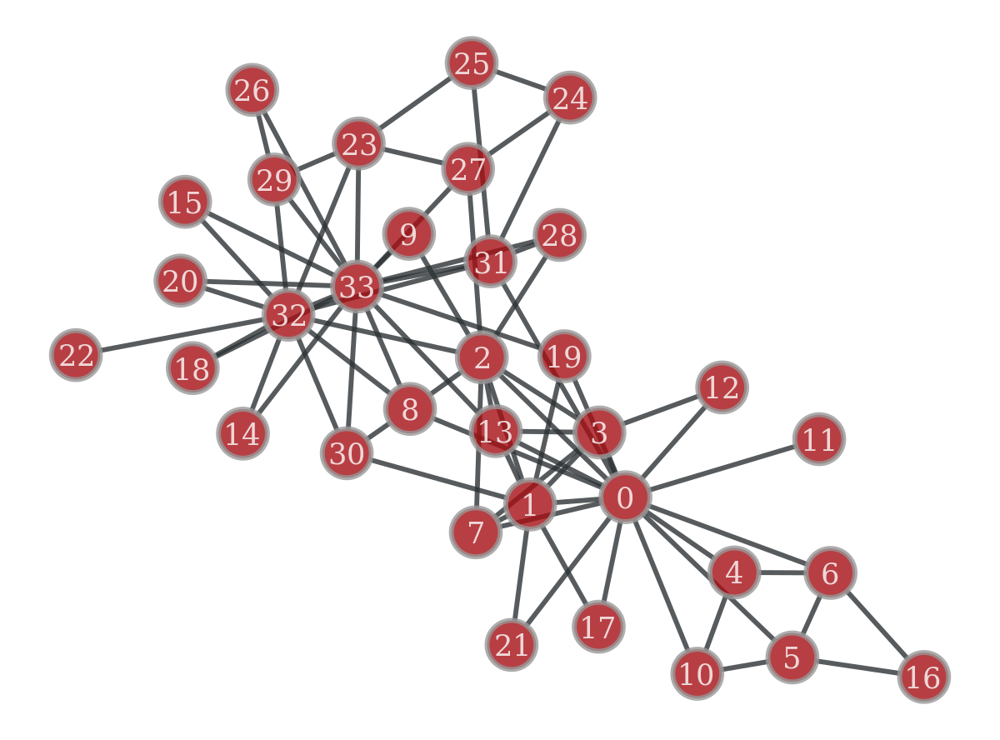

Matrix([[0], [2.12094014769569], [2.30804963539873], [2.53039414428277], [1.00000000000000], [2.00000000000000], [2.00000000000000], [2.47969196368860], [1.02851102583220], [2.22893206247800], [1.00000000000000], [-1.00000000000000], [1.53039414428269], [2.15210654178260], [0.459001561611878], [0.459001561611877], [3.00000000000000], [1.12094014769569], [0.459001561611879], [1.02788171651665], [0.459001561611877], [1.12094014769570], [0.0762382690651885], [0.734155913200442], [1.44596889347224], [1.05781988492227], [0.0349223289708742], [1.70452843457534], [1.75702472212583], [0.114039901891608], [1.30422636756988], [0.906605020710736], [0.538119134532594], [0.920882427079285]])
[ 0.          2.12094015  2.30804964  2.53039414  1.          2.
  2.          2.47969196  1.02851103  2.22893206  1.         -1.
  1.53039414  2.15210654  0.45900156  0.45900156  3.          1.12094015
  0.45900156  1.02788172  0.45900156  1.12094015  0.07623827  0.73415591
  1.44596889  1.05781988  0.03492233

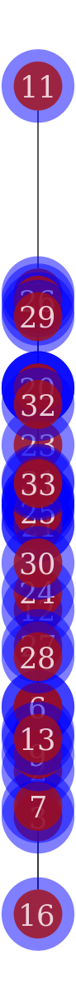

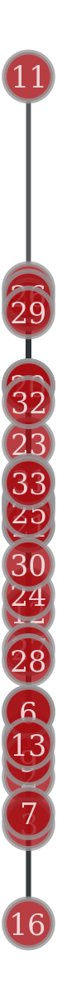

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f1cd4a7da30, at 0x7f1cd4a7dac0>

In [ ]:
from graph_tool.inference.util import float16
from graph_tool.all import *
import math
import matplotlib
import numpy as np
from scipy import sparse
from scipy.linalg import lu_factor, lu_solve
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import inv
from scipy.sparse.linalg import dsolve
from scipy.sparse.linalg.dsolve import linsolve
from sympy import Matrix

g = collection.ns["karate/77"]
#g = collection.ns["ugandan_village/friendship-1"]

in_degs = (g.get_in_degrees(g.get_vertices()))
out_degs = (g.get_out_degrees(g.get_vertices()))
imbalance = np.array(in_degs.astype(float) - out_degs.astype(float))
strength = in_degs + out_degs
adjacency = graph_tool.spectral.adjacency(g, weight=None, vindex=None, operator=False, csr=True).transpose()

laplacian = np.diag(strength) - (adjacency + adjacency.transpose())
print(laplacian)
print(imbalance)
graph_draw(g, vertex_text=g.vertex_index)

#print(dsolve.spsolve(sparse.csr_matrix(laplacian), imbalance, use_umfpack=True))
#print(linsolve.spsolve(sparse.csr_matrix(laplacian), imbalance))

remLapl = np.delete((np.delete(laplacian, (0), axis=0)), (0), axis=1)
remImb = np.delete(imbalance, (0), axis=0)

sol, params = Matrix(remLapl).gauss_jordan_solve(Matrix(remImb))
sol = sol.row_insert(0, Matrix([0]))
print(sol)

lu, piv = lu_factor(remLapl)
h = lu_solve((lu, piv), remImb)
h2 = np.insert(h, 0, 0, axis=0)
print(h2)

pos1 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos1[g.vertex(i)] = (0, h2[i])

pos2 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos2[g.vertex(i)] = (0, sol[i])

graph_draw(g, vertex_pen_width = 0, vertex_halo = True, pos=pos1, vertex_text=g.vertex_index)
graph_draw(g, pos=pos2, vertex_text=g.vertex_index)

# Experimental

adjacency
[[0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0.
  0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [1. 1. 0. 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 1. 1. 0. 0. 0. 1. 0.]
 [1. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 1. 0. 1. 1.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0

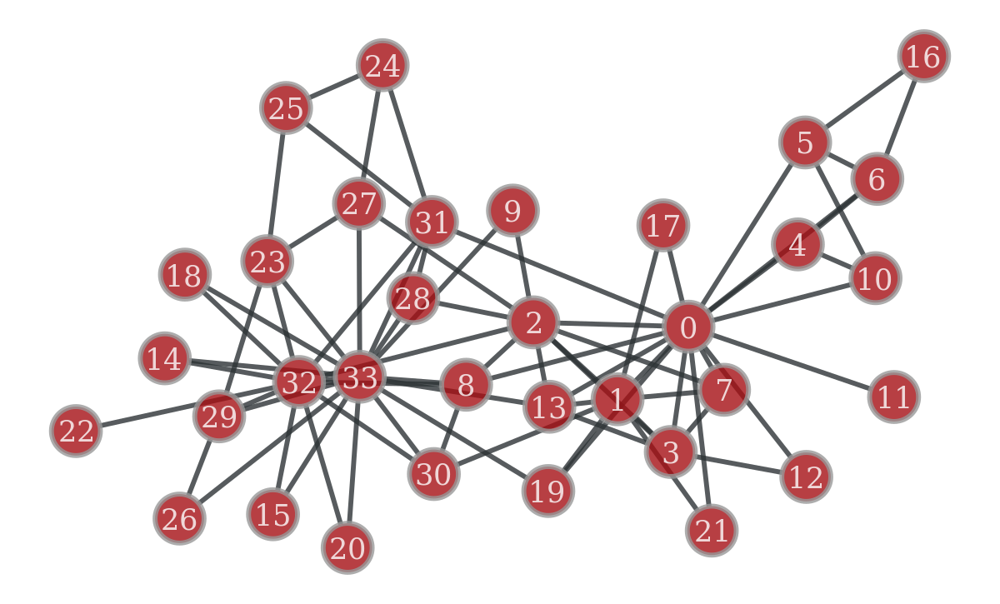

[ 0.          2.12094015  2.30804964  2.53039414  1.          2.
  2.          2.47969196  1.02851103  2.22893206  1.         -1.
  1.53039414  2.15210654  0.45900156  0.45900156  3.          1.12094015
  0.45900156  1.02788172  0.45900156  1.12094015  0.07623827  0.73415591
  1.44596889  1.05781988  0.03492233  1.70452843  1.75702472  0.1140399
  1.30422637  0.90660502  0.53811913  0.92088243]
1.935789131069325


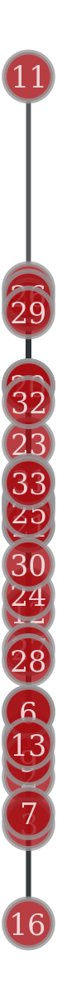

0.4376458032708032
0.053873556998557004
0.15226370851370857
0.01196188071188071
0.0006313131313131313
0.02998737373737374
0.02998737373737374
0.0
0.056737012987012996
0.0008477633477633477
0.0006313131313131313
0.0
0.0
0.041591510341510325
0.0
0.0
0.0
0.0
0.0
0.02936056998556999
0.0
0.0
0.0
0.01824494949494949
0.0022095959595959595
0.0038404882154882154
0.0
0.021702140452140452
0.0017947330447330447
0.0038690476190476187
0.01472763347763348
0.14034842472342468
0.18215788840788844
0.2750556156806156


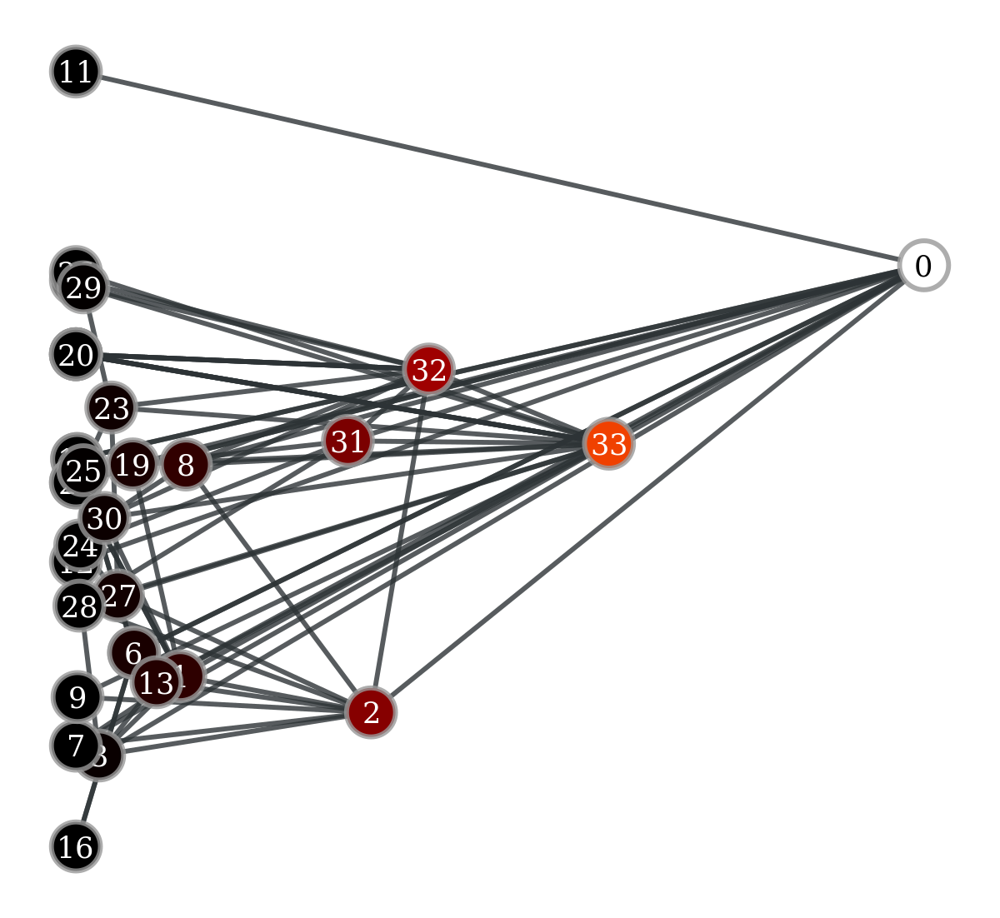

0.5689655172413793
0.4852941176470588
0.559322033898305
0.4647887323943662
0.3793103448275862
0.38372093023255816
0.38372093023255816
0.44
0.515625
0.4285714285714286
0.3793103448275862
0.3666666666666667
0.3707865168539326
0.5076923076923077
0.3707865168539326
0.3707865168539326
0.28448275862068967
0.375
0.3707865168539326
0.4925373134328358
0.3707865168539326
0.375
0.34375
0.39285714285714285
0.375
0.375
0.358695652173913
0.4520547945205479
0.44594594594594594
0.38372093023255816
0.4583333333333333
0.5409836065573771
0.515625
0.5409836065573771


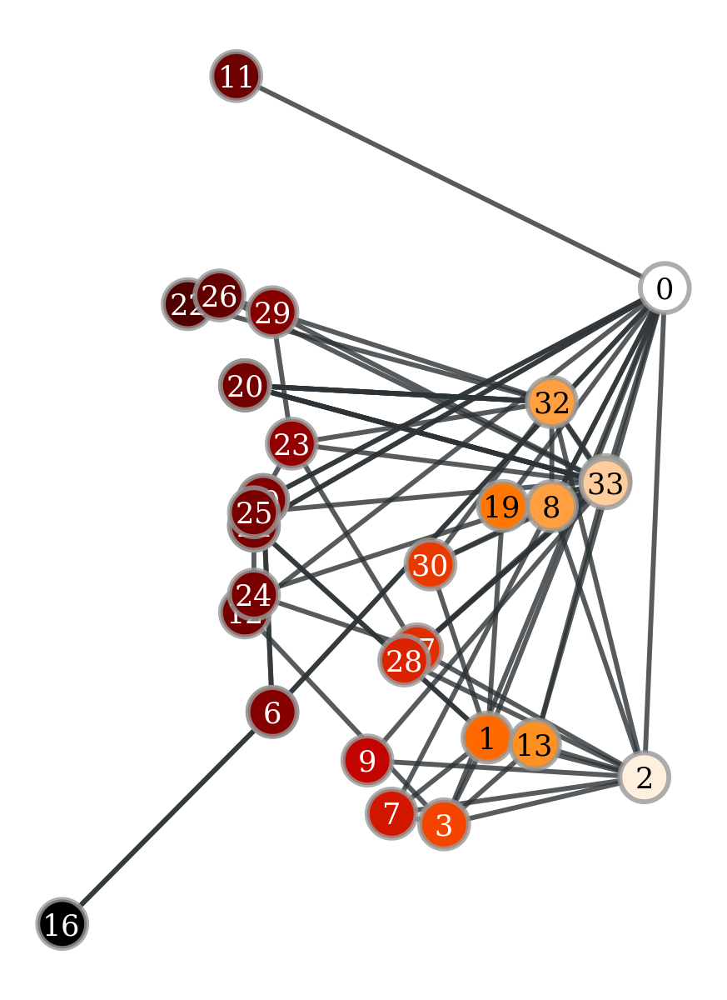

0.15
0.3333333333333333
0.24444444444444444
0.6666666666666666
0.6666666666666666
0.5
0.5
1.0
0.5
0.0
0.6666666666666666
0.0
1.0
0.6
1.0
1.0
1.0
1.0
1.0
0.3333333333333333
1.0
1.0
0.0
0.4
0.3333333333333333
0.3333333333333333
1.0
0.16666666666666666
0.3333333333333333
0.6666666666666666
0.5
0.2
0.18181818181818182
0.11666666666666667


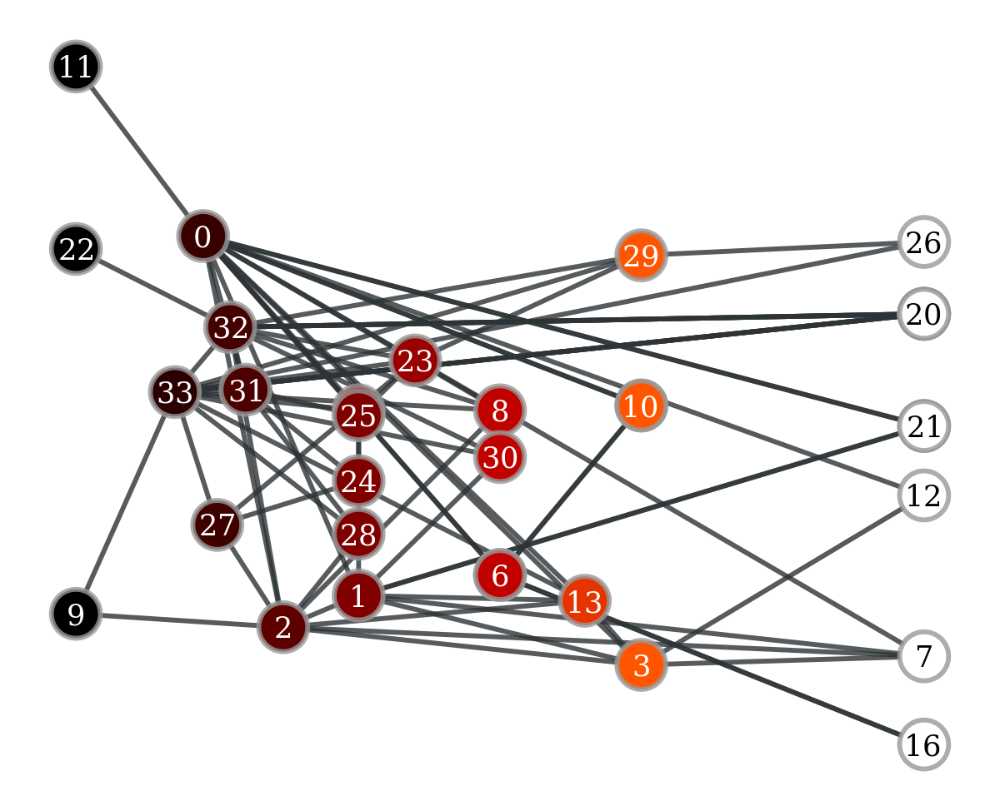

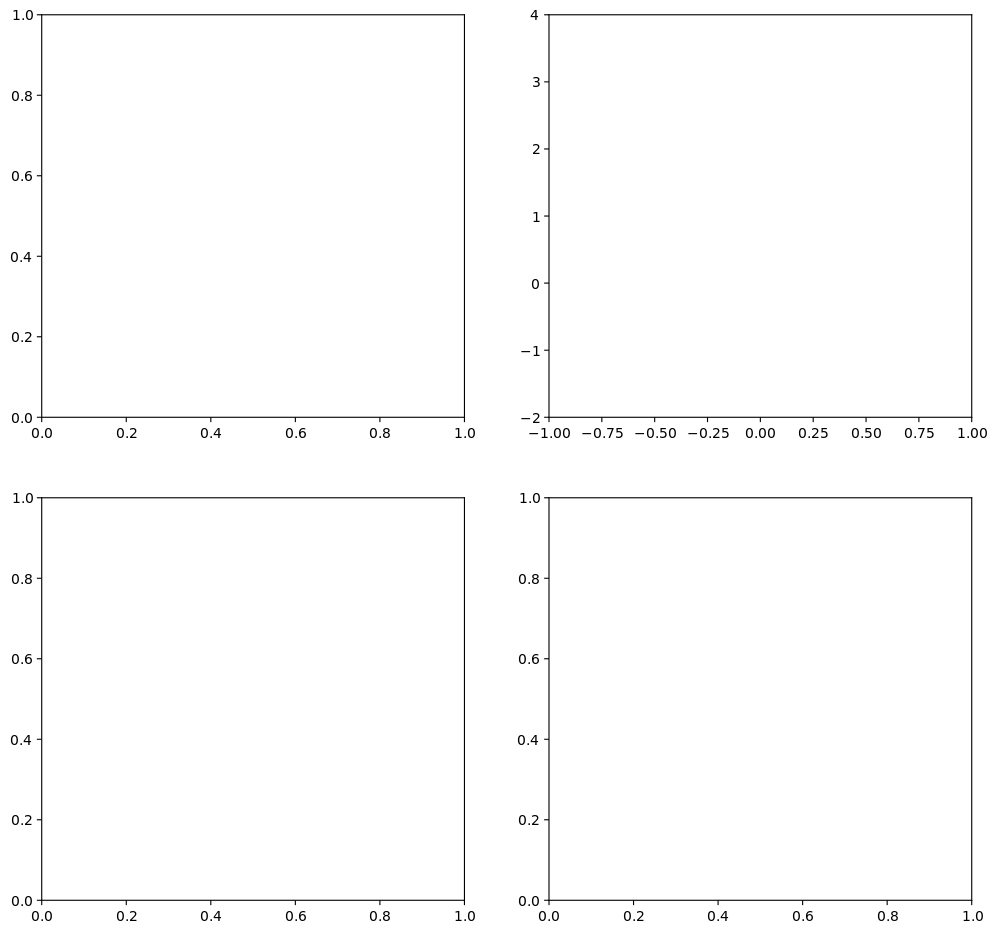

In [ ]:
%matplotlib inline
from graph_tool.inference.util import float16
from graph_tool.all import *
import math
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from scipy import sparse
from scipy.linalg import lu_factor, lu_solve
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import inv

plt.switch_backend("cairo")
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11.5))

#g = collection.ns["cs_department"]
g = collection.ns["karate/77"]
#g = collection.ns["adjnoun"]

adj = [ [ 1, 0, 1]
        , [ 1, 0, 1]
        , [ 1, 1, 0]]

#N = len(adj)
#g = Graph()
#g.set_directed( True )
#v = [ g.add_vertex() for i in range(N) ]
#for i in range(N):
#    for j in range(N):
#        if adj[i][j] != 0:
#            g.add_edge( v[i], v[j] )

#edges = g2.get_edges()
#in_degs = g2.get_in_degrees(g2.get_vertices())
#out_degs = g2.get_out_degrees(g2.get_vertices())
#print((out_degs[edges[:,0]] * in_degs[edges[:,1]]).sum())

#print(graph_tool.spectral.adjacency(g, weight=None, vindex=None, operator=False, csr=True).toarray())
#print(graph_tool.spectral.laplacian(g, operator=False, csr=True).toarray())

#name = g.vertex_properties["label"]

in_degs = (g.get_in_degrees(g.get_vertices()))
out_degs = (g.get_out_degrees(g.get_vertices()))
imbalance = np.array(in_degs.astype(float) - out_degs.astype(float))
strength = in_degs + out_degs
adjacency = graph_tool.spectral.adjacency(g, weight=None, vindex=None, operator=False, csr=True).transpose()
adj = adjacency.toarray()
np.set_printoptions(threshold=np.inf)
print("adjacency")
print(adj)
print("laplcian")
laplacian = np.diag(strength) - (adjacency + adjacency.transpose())
print(laplacian)
graph_draw(g, vertex_text=g.vertex_index)
#graph_draw(g, vertex_text=g.vertex_index, vertex_size=1, mplfig=ax1)

remLapl = np.delete((np.delete(laplacian, (0), axis=0)), (0), axis=1)
remImb = np.delete(imbalance, (0), axis=0)

lu, piv = lu_factor(remLapl)
h = lu_solve((lu, piv), remImb)
h2 = np.insert(h, 0, 0, axis=0)
print(h2)

top = 0
bottom = 0

for i in range(g.num_vertices()):
  for j in range(g.num_vertices()):
    top += (adj[i][j])*((h2[j]-h2[i]-1)**2)
    bottom += adj[i][j]
print(top/bottom)

#x axis too small?
pos1 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos1[g.vertex(i)] = (0, h2[i])

graph_draw(g, pos=pos1, vertex_text=g.vertex_index)
#graph_draw(g, pos=pos1, vertex_pen_width = 0, vertex_text=g.vertex_index, vertex_size = 0.1, edge_pen_width = 0.01, mplfig=ax2)
ax2.set_xlim([-1, 1])
ax2.set_ylim([-2, 4])

vp, ep = graph_tool.centrality.betweenness(g)

pos2 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos2[g.vertex(i)] = (vp[i]*10, h2[i])
    print(vp[i])

graph_draw(g, pos=pos2, vertex_text=g.vertex_index, vertex_fill_color=vp,
              vcmap=matplotlib.cm.gist_heat)
#graph_draw(g, pos=pos2, vertex_text=g.vertex_index, vertex_fill_color=vp, vertex_size=prop_to_size(vp, mi=0, ma=0.025),
#              edge_pen_width=prop_to_size(ep, mi=0, ma=0.01),
#              vcmap=matplotlib.cm.gist_heat, mplfig=ax3)

cp = graph_tool.centrality.closeness(g)

pos4 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos4[g.vertex(i)] = (cp[i]*10, h2[i])
    print(cp[i])

graph_draw(g, pos=pos4, vertex_text=g.vertex_index, vertex_fill_color=cp, vcmap=matplotlib.cm.gist_heat)

lc = local_clustering(g)
pos3 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos3[g.vertex(i)] = (lc[i]*5, h2[i])
    print(lc[i])

graph_draw(g, pos=pos3, vertex_text=g.vertex_index, vertex_fill_color=lc,
              vcmap=matplotlib.cm.gist_heat)
#graph_draw(g, pos=pos3, vertex_text=g.vertex_index, vertex_fill_color=lc, vertex_size=prop_to_size(lc, mi=0, ma=0.005),
#              edge_pen_width=prop_to_size(ep, mi=0, ma=0.01),
#              vcmap=matplotlib.cm.gist_heat, mplfig=ax4)

%matplotlib inline
plt.show()
#For Planar Graphs Only
#pos = planar_layout(g)
#graph_draw(g, pos=pos)

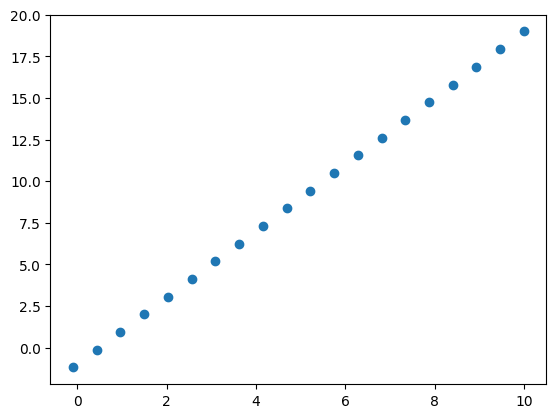

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

X = np.linspace(-0.1, 10, 20)
y = 2 * X - 1
plt.scatter(X, y)
plt.show()

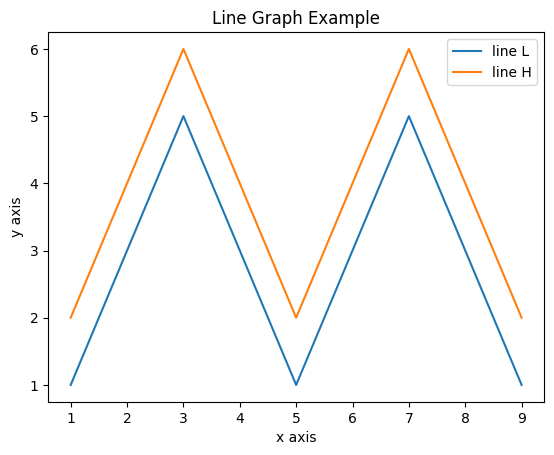

In [ ]:
import matplotlib.pyplot as plt
x  = [1, 2, 3, 4, 5, 6, 7, 8, 9]
y1 = [1, 3, 5, 3, 1, 3, 5, 3, 1]
y2 = [2, 4, 6, 4, 2, 4, 6, 4, 2]
plt.plot(x, y1, label="line L")
plt.plot(x, y2, label="line H")
plt.plot()

plt.xlabel("x axis")
plt.ylabel("y axis")
plt.title("Line Graph Example")
plt.legend()
plt.show()


# Converting sentences into graphs normalised Western


['in', 'times', 'past', 'there', 'lived', 'a', 'king', 'and', 'queen', 'who', 'said', 'to', 'each', 'other', 'every', 'day', 'of', 'their', 'lives', 'would', 'that', 'we', 'had', 'a', 'child', '!', 'and', 'yet', 'they', 'had', 'none', '.', 'but', 'it', 'happened', 'once', 'that', 'when', 'the', 'queen', 'was', 'bathing', 'there', 'came', 'a', 'frog', 'out', 'of', 'the', 'water', 'and', 'he', 'squatted', 'on', 'the', 'ground', 'and', 'said', 'to', 'her', 'thy', 'wish', 'shall', 'be', 'fulfilled', 'before', 'a', 'year', 'has', 'gone', 'by', 'thou', 'shalt', 'bring', 'a', 'daughter', 'into', 'the', 'world', '.', 'and', 'as', 'the', 'frog', 'foretold', 'so', 'it', 'happened', 'and', 'the', 'queen', 'bore', 'a', 'daughter', 'so', 'beautiful', 'that', 'the', 'king', 'could', 'not', 'contain', 'himself', 'for', 'joy', 'and', 'he', 'ordained', 'a', 'great', 'feast', '.', 'not', 'only', 'did', 'he', 'bid', 'to', 'it', 'his', 'relations', 'friends', 'and', 'acquaintances', 'but', 'also', 'the', 

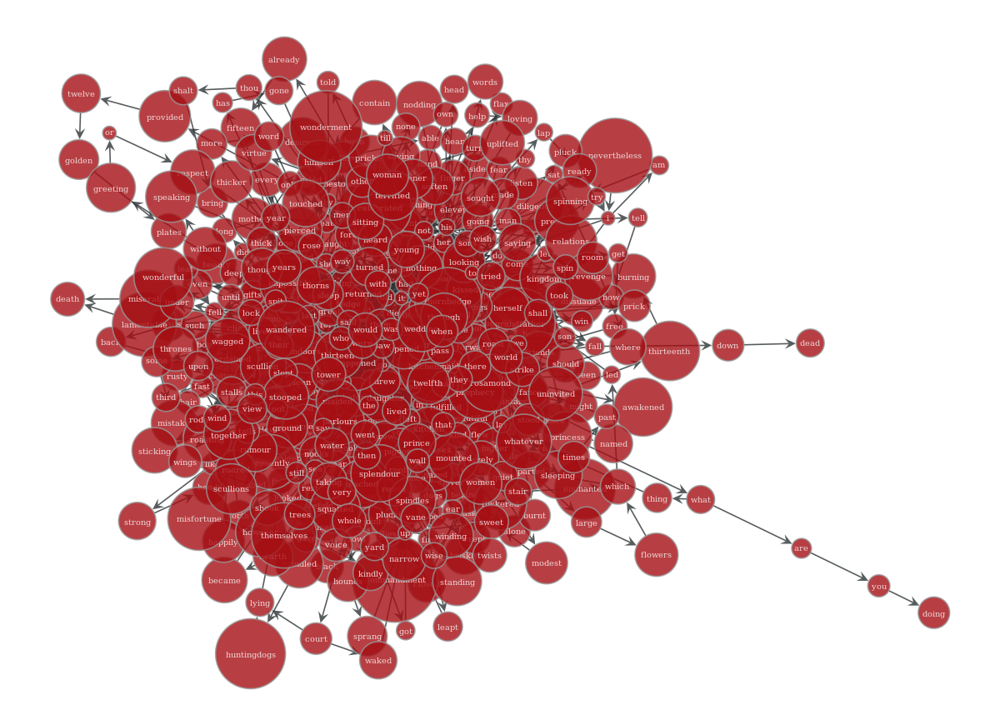

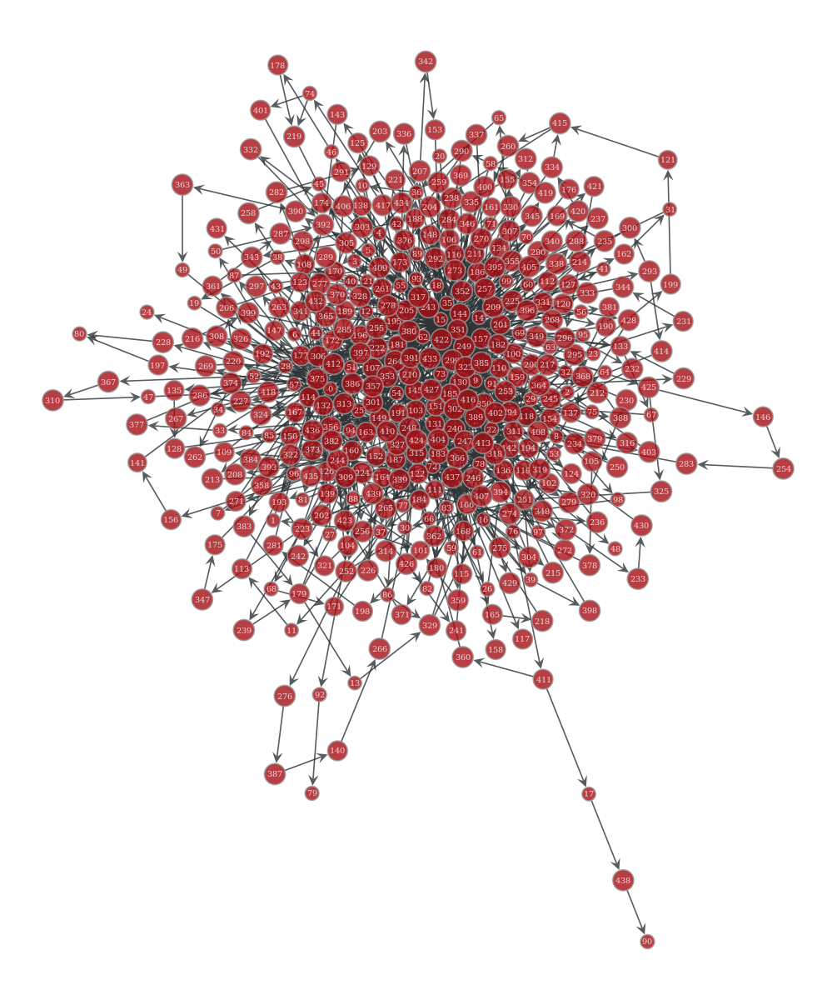

Trophic Incoherence
0.9263846314842026
Trophic Levels
[ 0.         -0.12758243 -0.0414513  -0.03709463 -0.03877068 -0.04328666
  0.35054593  0.02290826  0.01655964  0.18246362  0.12733562 -0.23475233
 -0.09488937 -0.34421089  0.33834453 -0.05979377 -0.13882504  0.59515646
 -0.05351222 -0.04521217 -1.16299921  0.2495325   0.29378861 -0.14120795
  0.93320955 -0.13295208  0.23356449 -0.0155308  -0.06679045 -0.01234435
 -0.07870701 -0.10721305 -0.05474567 -0.5514212  -0.03003836  0.10740306
 -0.06740283 -0.2172435  -0.05250297 -0.09035317 -0.06420034  0.15489538
 -0.05979377 -0.31161247  0.21323686  0.00348197  0.11166673 -0.02448235
  1.0429589  -0.06919083  0.21347462 -0.02677954 -0.09792939 -0.34965689
 -0.07600281 -0.103106   -0.12673926 -0.19153496 -0.19614587  0.06183394
 -0.11139649  0.08359432  0.26338402 -0.00314295 -0.19281066 -0.42830076
 -0.06675891 -0.09771588 -0.27399695 -0.61088952 -0.11139649 -0.05979377
 -0.0849309  -0.23013624 -0.16889651 -0.09672843 -0.00763498 -0.235389

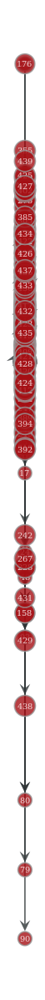

Betweenness Centrality
[0.0919299  0.00123743 0.00595756 0.00031302 0.00321033 0.0010617
 0.00021633 0.00120477 0.         0.00675464 0.00047487 0.00232725
 0.         0.00071065 0.00808879 0.33879409 0.00183683 0.00441019
 0.00304356 0.0022675  0.         0.01161413 0.01032375 0.00200333
 0.         0.00648616 0.         0.00055207 0.01663689 0.01440042
 0.00125264 0.00228973 0.00122003 0.00340433 0.00013901 0.00126395
 0.00692063 0.00899193 0.00219469 0.00312386 0.00064794 0.
 0.         0.00017774 0.0008091  0.0022675  0.00260642 0.00452981
 0.         0.00452981 0.00050388 0.02626736 0.01648598 0.00337759
 0.02709321 0.013479   0.00331392 0.00396175 0.00593165 0.00020453
 0.00151557 0.00024254 0.00781711 0.         0.0012001  0.0000208
 0.00043121 0.0003467  0.00223693 0.00537771 0.         0.
 0.01753206 0.00303931 0.00402197 0.00013255 0.00020614 0.00131817
 0.01249792 0.         0.         0.00043738 0.00110028 0.00237293
 0.00044909 0.         0.00421808 0.00032562 0.00836982 0

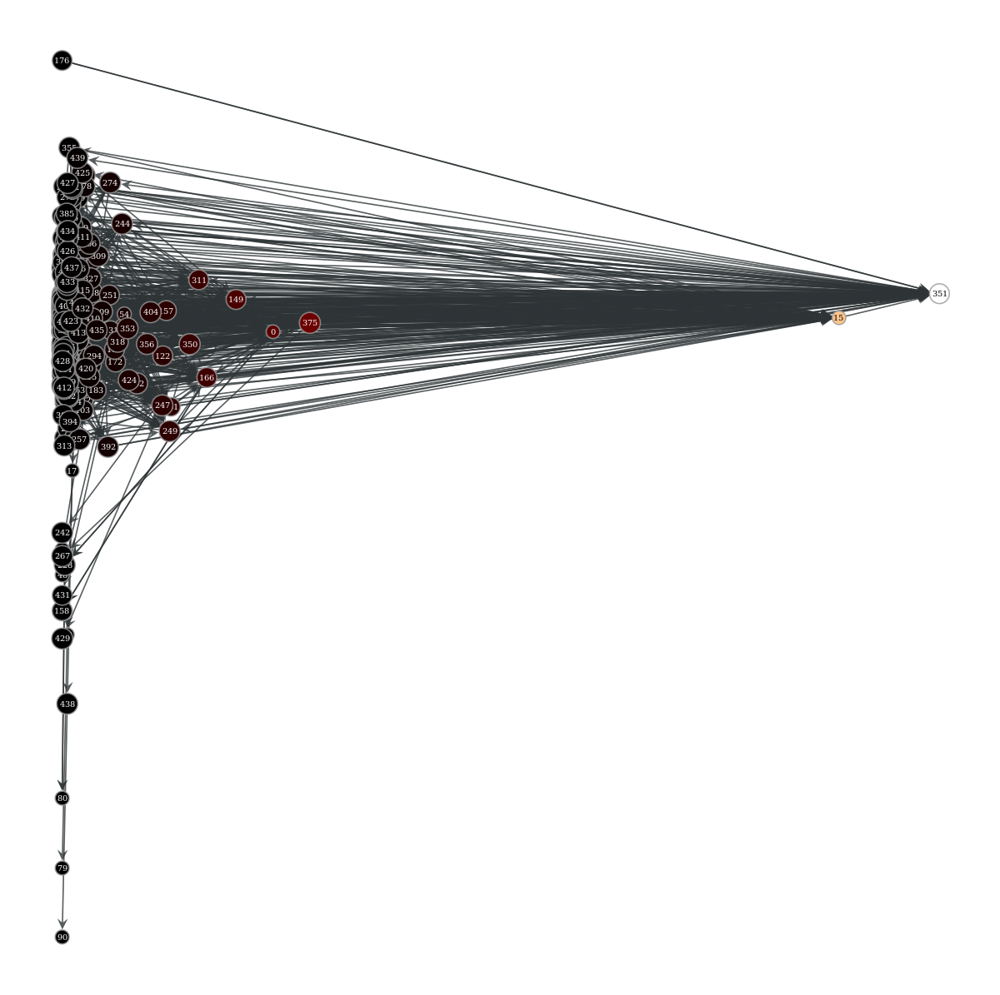

Closeness Centrality
[0.29133333 0.2573616  0.28229974 0.26042908 0.30055021 0.23827699
 0.246614   0.24413408 0.26183343 0.29250335 0.24787294 0.18723222
 0.26167665 0.19149869 0.24773243 0.41187559 0.26183343 0.66666667
 0.28731098 0.2573616  0.26164875 0.32108744 0.24578178 0.2921123
 0.         0.30347222 0.20779838 0.24427054 0.26678877 0.24675325
 0.22619048 0.22855649 0.24116998 0.22927597 0.22607346 0.25721012
 0.27244389 0.21244531 0.20506804 0.23814714 0.25721012 0.18844329
 0.29191717 0.22607346 0.23183024 0.29250335 0.16428571 0.22642487
 0.         0.2573616  0.24399777 0.31192006 0.29952022 0.29230769
 0.35044106 0.26958667 0.22724909 0.29607046 0.29309188 0.24633596
 0.2921123  0.22951681 0.19872669 0.24130315 0.26167665 0.21463654
 0.223073   0.24143646 0.19508929 0.25934718 0.26167665 0.29191717
 0.23659989 0.3015873  0.19720217 0.23195329 0.2464749  0.24985706
 0.27746032 0.         0.         0.20789724 0.24210526 0.22724909
 0.23814714 0.22607346 0.19124726 0.216658

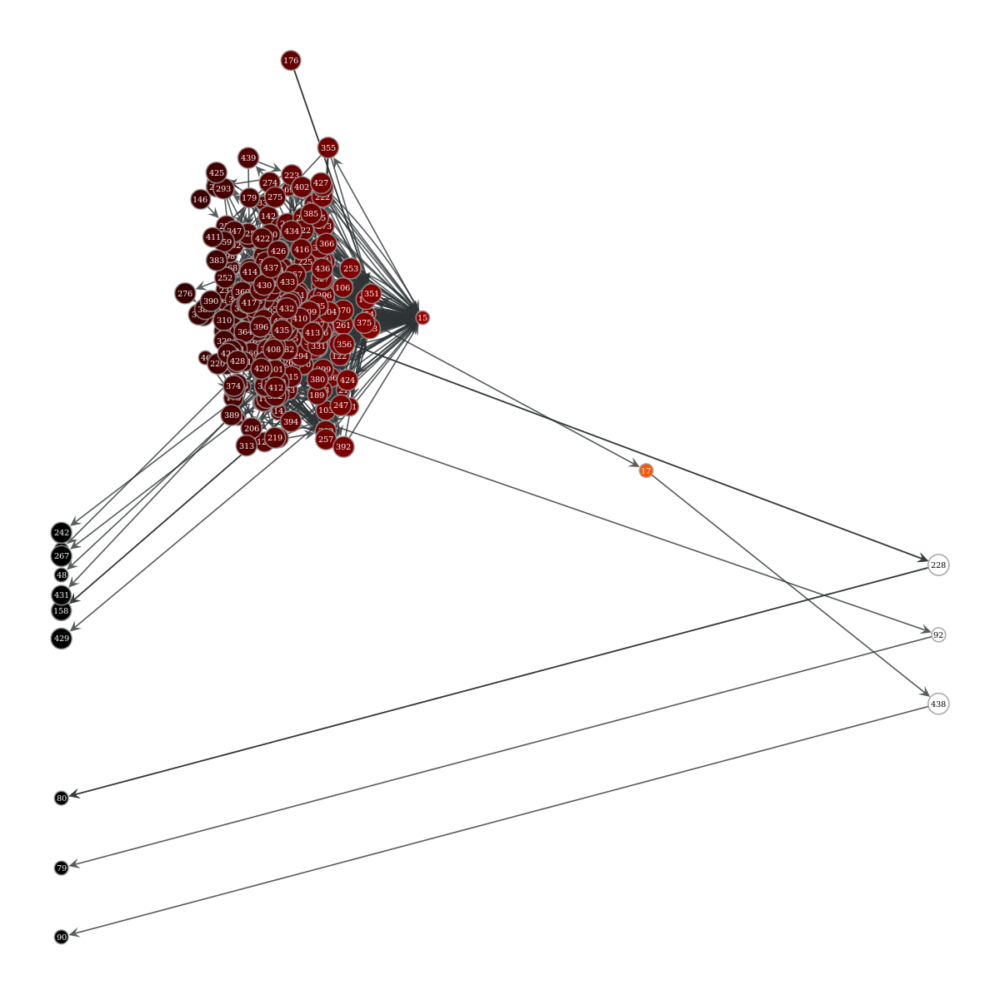

Local Clustering Coeffient
[0.02705314 0.         0.26666667 1.         0.16666667 0.
 0.         0.         1.         0.38888889 0.         0.
 1.         0.         0.         0.01720634 0.         0.
 0.4        0.         0.         0.2        0.07142857 1.
 0.         0.06666667 1.         0.         0.01515152 0.07142857
 0.         0.         1.         0.         0.         0.
 0.06666667 0.         0.         0.16666667 0.         1.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.06666667 0.03571429 0.
 0.22727273 0.2        0.         0.16666667 0.16666667 0.
 1.         0.         0.         1.         0.         0.
 0.         0.         0.         0.33333333 1.         0.
 0.02222222 0.33333333 0.         0.         0.         0.33333333
 0.25       0.         0.         0.         0.         0.
 0.         0.66666667 0.         0.         0.         1.
 0.         0.4        0.         0.06666667 0.         1.
 0.         0

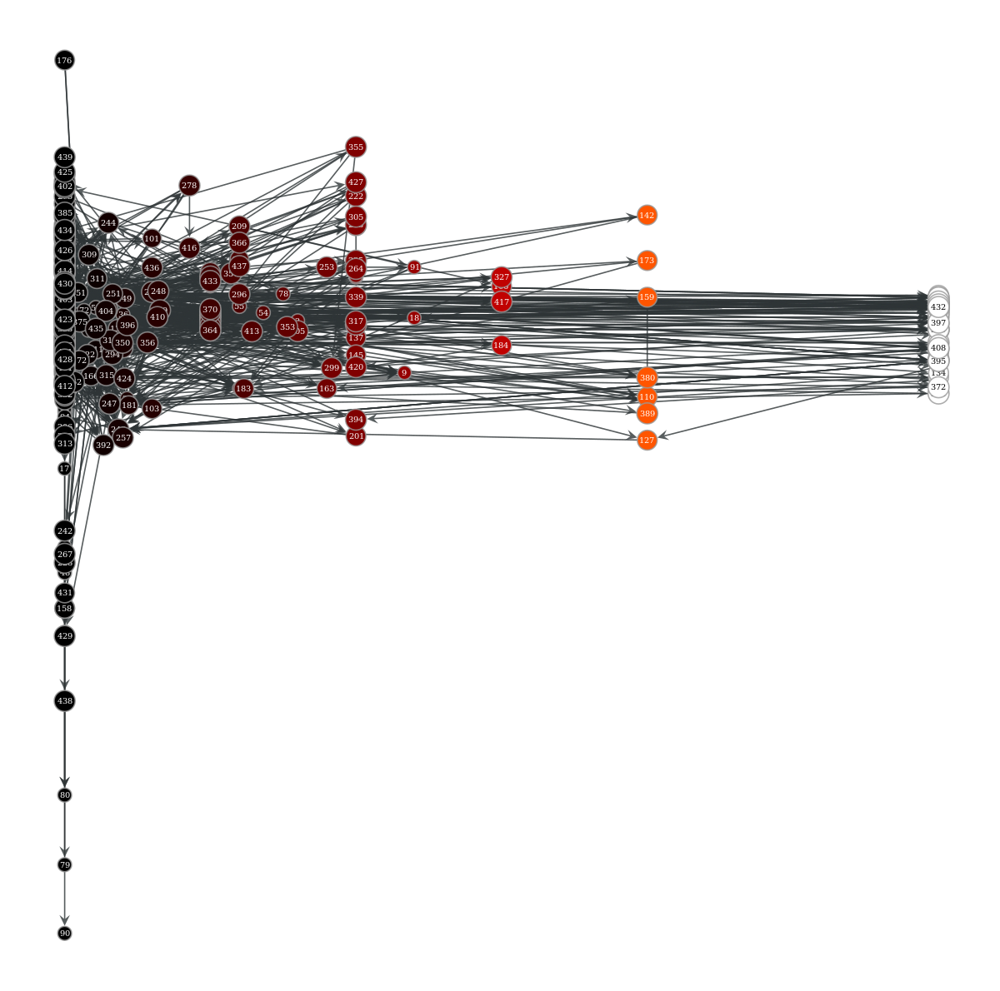

Page Rank
[0.0204072  0.00088544 0.00285567 0.00115173 0.00155547 0.00115173
 0.00204711 0.00112207 0.00127178 0.00560738 0.00106959 0.00088544
 0.00115436 0.00090966 0.00398688 0.05530704 0.0011699  0.00071058
 0.00291685 0.00134718 0.00036821 0.00345275 0.00454682 0.00095648
 0.00101079 0.00195899 0.0011658  0.00102036 0.00529185 0.00373418
 0.00105981 0.00127827 0.00107066 0.00093899 0.00107496 0.00141151
 0.00247545 0.00182552 0.00115173 0.00164232 0.00109864 0.00107066
 0.00115173 0.00068342 0.00109097 0.00136214 0.00115173 0.00151676
 0.00108852 0.00145474 0.00101079 0.00739905 0.00370959 0.00080556
 0.00533649 0.00258144 0.00107066 0.00138012 0.0017333  0.00102036
 0.00107066 0.00102036 0.00259453 0.00115173 0.00095648 0.00056401
 0.00093899 0.00108648 0.00072912 0.00107066 0.00115173 0.00115173
 0.00406657 0.0012719  0.00115624 0.00067156 0.00095648 0.00109097
 0.00283653 0.00128572 0.00222286 0.00109097 0.00088544 0.00092067
 0.00072912 0.00184882 0.00087635 0.00109009 0.00199

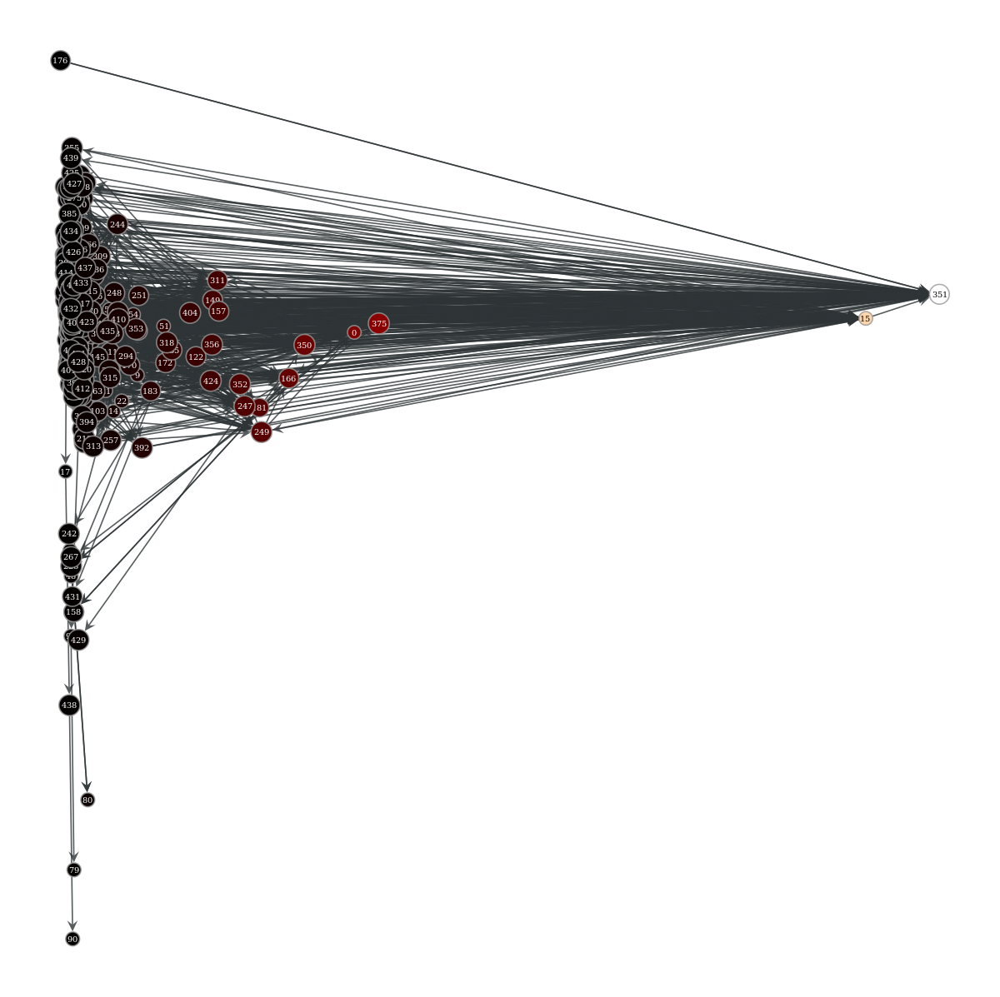

RuntimeError: ignored

<Figure size 2400x2300 with 2 Axes>

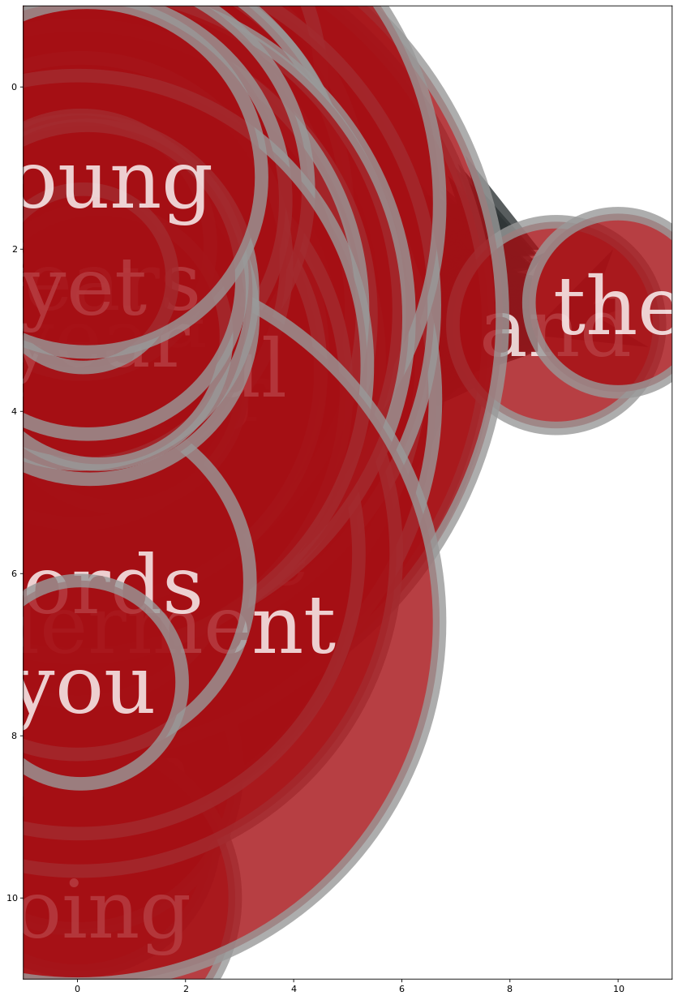

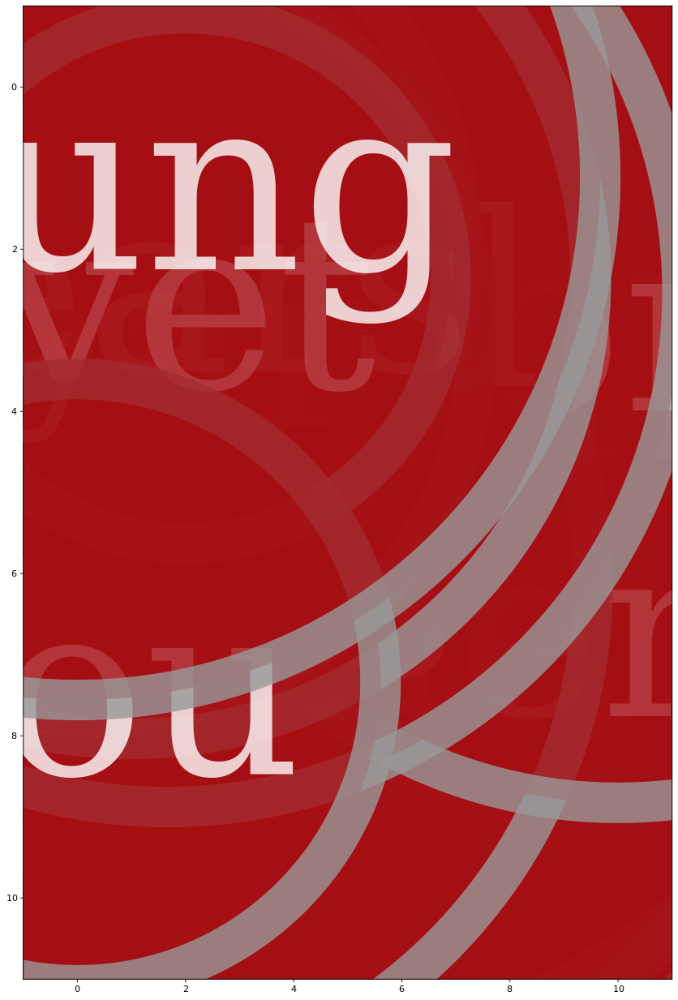

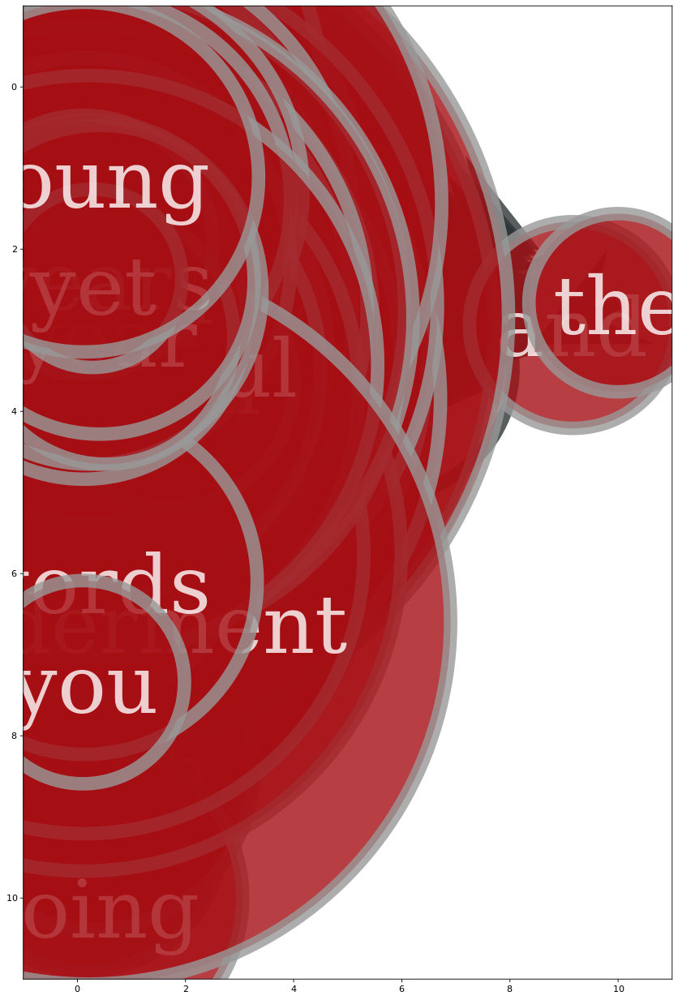

In [ ]:
from graph_tool.inference.util import float16
from graph_tool.all import *
import math
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import string
import re
from scipy import sparse
from scipy.linalg import lu_factor, lu_solve
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import inv

plt.switch_backend("cairo")
#fig, ax1 = plt.subplots(1, 1)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 23))

fig1 = matplotlib.pyplot.figure(figsize=(20, 15), dpi=80)
fig2 = matplotlib.pyplot.figure(figsize=(20, 15), dpi=80)
fig3 = matplotlib.pyplot.figure(figsize=(20, 15), dpi=80)
axes1 = fig1.add_axes([0.5, 1, 0.5, 1])
axes2 = fig2.add_axes([0.5, 1, 0.5, 1])
axes3 = fig3.add_axes([0.5, 1, 0.5, 1])

# String.puncuation = !"#$%&'()*+,-./:;<=>?@[\]^_`{|}~
remPunc = string.punctuation
remPunc = remPunc.replace("!","")
remPunc = remPunc.replace(".","")
remPunc = remPunc.replace("?","")

text = "In times past there lived a king and queen, who said to each other every day of their lives, Would that we had a child! and yet they had none. But it happened once that when the queen was bathing, there came a frog out of the water, and he squatted on the ground, and said to her: Thy wish shall be fulfilled; before a year has gone by, thou shalt bring a daughter into the world. And as the frog foretold, so it happened; and the queen bore a daughter so beautiful that the king could not contain himself for joy, and he ordained a great feast. Not only did he bid to it his relations, friends, and acquaintances, but also the wise women, that they might be kind and favourable to the child. There were thirteen of them in his kingdom, but as he had only provided twelve golden plates for them to eat from, one of them had to be left out. However, the feast was celebrated with all splendour; and as it drew to an end, the wise women stood forward to present to the child their wonderful gifts: one bestowed virtue, one beauty, a third riches, and so on, whatever there is in the world to wish for. And when eleven of them had said their say, in came the uninvited thirteenth, burning to revenge herself, and without greeting or respect, she cried with a loud voice: In the fifteenth year of her age the princess shall prick herself with a spindle and shall fall down dead. And without speaking one more word she turned away and left the hall. Every one was terrified at her saying, when the twelfth came forward, for she had not yet bestowed her gift, and though she could not do away with the evil prophecy, yet she could soften it, so she said: The princess shall not die, but fall into a deep sleep for a hundred years. Now the king, being desirous of saving his child even from this misfortune, gave commandment that all the spindles in his kingdom should be burnt up. The maiden grew up, adorned with all the gifts of the wise women; and she was so lovely, modest, sweet, and kind and clever, that no one who saw her could help loving her. It happened one day, she being already fifteen years old, that the king and queen rode abroad, and the maiden was left behind alone in the castle. She wandered about into all the nooks and corners, and into all the chambers and parlours, as the fancy took her, till at last she came to an old tower. She climbed the narrow winding stair which led to a little door, with a rusty key sticking out of the lock; she turned the key, and the door opened, and there in the little room sat an old woman with a spindle, diligently spinning her flax. Good day, mother, said the princess, what are you doing? - I am spinning, answered the old woman, nodding her head. What thing is that that twists round so briskly? asked the maiden, and taking the spindle into her hand she began to spin; but no sooner had she touched it than the evil prophecy was fulfilled, and she pricked her finger with it. In that very moment she fell back upon the bed that stood there, and lay in a deep sleep. And this sleep fell upon the whole castle; the king and queen, who had returned and were in the great hall, fell fast asleep, and with them the whole court. The horses in their stalls, the dogs in the yard, the pigeons on the roof, the flies on the wall, the very fire that flickered on the hearth, became still, and slept like the rest; and the meat on the spit ceased roasting, and the cook, who was going to pull the scullion's hair for some mistake he had made, let him go, and went to sleep. And the wind ceased, and not a leaf fell from the trees about the castle. Then round about that place there grew a hedge of thorns thicker every year, until at last the whole castle was hidden from view, and nothing of it could be seen but the vane on the roof. And a rumour went abroad in all that country of the beautiful sleeping Rosamond, for so was the princess called; and from time to time many kings' sons came and tried to force their way through the hedge; but it was impossible for them to do so, for the thorns held fast together like strong hands, and the young men were caught by them, and not being able to get free, there died a lamentable death. Many a long year afterwards there came a king's son into that country, and heard an old man tell how there should be a castle standing behind the hedge of thorns, and that there a beautiful enchanted princess named Rosamond had slept for a hundred years, and with her the king and queen, and the whole court. The old man had been told by his grandfather that many king's sons had sought to pass the thorn-hedge, but had been caught and pierced by the thorns, and had died a miserable death. Then said the young man: Nevertheless, I do not fear to try; I shall win through and see the lovely Rosamond. The good old man tried to dissuade him, but he would not listen to his words. For now the hundred years were at an end, and the day had come when Rosamond should be awakened. When the prince drew near the hedge of thorns, it was changed into a hedge of beautiful large flowers, which parted and bent aside to let him pass, and then closed behind him in a thick hedge. When he reached the castle-yard, he saw the horses and brindled hunting-dogs lying asleep, and on the roof the pigeons were sitting with their heads under their wings. And when he came indoors, the flies on the wall were asleep, the cook in the kitchen had his hand uplifted to strike the scullion, and the kitchen-maid had the black fowl on her lap ready to pluck. Then he mounted higher, and saw in the hall the whole court lying asleep, and above them, on their thrones, slept the king and the queen. And still he went farther, and all was so quiet that he could hear his own breathing; and at last he came to the tower, and went up the winding stair, and opened the door of the little room where Rosamond lay. And when he saw her looking so lovely in her sleep, he could not turn away his eyes; and presently he stooped and kissed her. And she awaked, and opened her eyes, and looked very kindly on him. And she rose, and they went forth together, and the king and the queen and whole court waked up, and gazed on each other with great eyes of wonderment. And the horses in the yard got up and shook themselves, the hounds sprang up and wagged their tails, the pigeons on the roof drew their heads from under their wings, looked round, and flew into the field, the flies on the wall crept on a little farther, the kitchen fire leapt up and blazed, and cooked the meat, the joint on the spit began to roast, the cook gave the scullion such a box on the ear that he roared out, and the maid went on plucking the fowl. Then the wedding of the Prince and Rosamond was held with all splendour, and they lived very happily together until their lives' end."
table = str.maketrans(dict.fromkeys(remPunc))
text_nopunc = text.translate(table)

words = re.findall(r"[\w']+|[.,!?;]", text_nopunc.lower())

words_table = str.maketrans(dict.fromkeys(string.punctuation))
words_table_nopunc = text.translate(words_table).lower().split()

#new_text = text_nopunc.lower()
#print(new_text)
print(words)
print(words_table_nopunc)

#words = new_text.split()
#print(words)

values, counts = np.unique(words_table_nopunc, return_counts=True)
print(counts)
print(values)

N = len(values)
adj = np.zeros( (N, N) )
for i in range(len(values)):
  for j in range(len(values)):
    for z in range(len(words)-1):
      if words[z] == values[i] and words[z+1] == values[j]:
        adj[i][j] += 1
        break;
                         

np.set_printoptions(threshold=np.inf)
#print(adj)

g = Graph()
g.set_directed( True )

edge_weights = g.new_edge_property("double")
g.edge_properties["weight"] = edge_weights
vertex_labels = g.new_vertex_property("string")
g.vertex_properties["labels"] = vertex_labels

v = [ g.add_vertex() for i in range(N) ]
for i in range(N):
  vertex_labels[v[i]] = values[i]
  for j in range(N):
    if adj[i][j] != 0:
      e = g.add_edge( v[i], v[j] )
      edge_weights[e] = adj[i,j]

in_degs = (g.get_in_degrees(g.get_vertices()))
out_degs = (g.get_out_degrees(g.get_vertices()))
imbalance = np.array(in_degs.astype(float) - out_degs.astype(float))
strength = in_degs + out_degs
adjacency = graph_tool.spectral.adjacency(g, weight=edge_weights, vindex=None, operator=False, csr=True).transpose()

laplacian = np.diag(strength) - (adjacency + adjacency.transpose())

graph_draw(g, vertex_text=vertex_labels, mplfig=ax1)#1
graph_draw(g, vertex_text=vertex_labels)
graph_draw(g, vertex_text=g.vertex_index)
#ax1.set_xlim([-35, 35])
#ax1.set_ylim([-40, 40])

remLapl = np.delete((np.delete(laplacian, (0), axis=0)), (0), axis=1)
remImb = np.delete(imbalance, (0), axis=0)

lu, piv = lu_factor(remLapl)
h = lu_solve((lu, piv), remImb)
h2 = np.insert(h, 0, 0, axis=0)

print("Trophic Incoherence")
top = 0
bottom = 0
for i in range(g.num_vertices()):
  for j in range(g.num_vertices()):
    top += (adj[i,j])*((h2[j]-h2[i]-1)**2)
    bottom += adj[i,j]
print(top/bottom)

pos1 = g.new_vertex_property("vector<double>")
print("Trophic Levels")
np.set_printoptions(suppress=True)

def normalise(arr, t_min, t_max):
  norm_arr = []
  diff = t_max - t_min
  diff_arr = max(arr) - min(arr)   
  for i in arr:
      temp = (((i - min(arr))*diff)/diff_arr) + t_min
      norm_arr.append(temp)
  return norm_arr

normtc = normalise(h2, 0, 10)
print(h2)
print(normtc)
for i in range(len(g.get_vertices())):
  pos1[g.vertex(i)] = (0, normtc[i])
graph_draw(g, pos=pos1, vertex_text=vertex_labels, mplfig=ax2)#2
graph_draw(g, pos=pos1, vertex_text=g.vertex_index)
ax2.set_xlim([-5, 5])


vp, ep = graph_tool.centrality.betweenness(g)
pos2 = g.new_vertex_property("vector<double>")
print("Betweenness Centrality")
print(vp.get_array())
normvp = normalise(vp, 0, 10)
print(normvp)
for i in range(len(g.get_vertices())):
  pos2[g.vertex(i)] = (normvp[i], normtc[i])

graph_draw(g, pos=pos2, vertex_text=vertex_labels, vertex_size=2, mplfig=axes1)#3
graph_draw(g, pos=pos2, vertex_text=g.vertex_index, vertex_fill_color=vp, vcmap=matplotlib.cm.gist_heat)

cp = graph_tool.centrality.closeness(g)
print("Closeness Centrality")
for i in range(len(g.get_vertices())):
  if (np.isnan(cp[i])):
    cp [i] = 0
print(cp.get_array())
normcp = normalise(cp, 0, 10)
print(normcp)
pos3 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
  pos3[g.vertex(i)] = (normcp[i], normtc[i])

graph_draw(g, pos=pos3, vertex_text=g.vertex_index, vertex_fill_color=cp, vcmap=matplotlib.cm.gist_heat)


lc = local_clustering(g)
pos4 = g.new_vertex_property("vector<double>")
print("Local Clustering Coeffient")
print(lc.get_array())
normlc = normalise(lc, 0, 10)
print(normlc)
for i in range(len(g.get_vertices())):
  pos4[g.vertex(i)] = (normlc[i], normtc[i])

graph_draw(g, pos=pos4, vertex_text=vertex_labels, vertex_size=6, mplfig=axes2)#4
graph_draw(g, pos=pos4, vertex_text=g.vertex_index, vertex_fill_color=lc, vcmap=matplotlib.cm.gist_heat)

pr = pagerank(g)
pos5 = g.new_vertex_property("vector<double>")
print("Page Rank")
print(pr.get_array())
normpr = normalise(pr, 0, 10)
print(normpr)
for i in range(len(g.get_vertices())):
  pos5[g.vertex(i)] = (normpr[i], normtc[i])

graph_draw(g, pos=pos5, vertex_text=vertex_labels, vertex_size=2, mplfig=axes3)#5
graph_draw(g, pos=pos5, vertex_text=g.vertex_index, vertex_fill_color=pr, vcmap=matplotlib.cm.gist_heat)

%matplotlib inline
plt.show()


# Converting sentences into graphs Eastern



['以', '前', '有', '个', '国', '王', '和', '王', '后', '一', '直', '没', '有', '孩', '子', '他', '们', '为', '此', '非', '常', '伤', '心', '苦', '恼', '。', '有', '一', '天', '王', '后', '正', '在', '河', '边', '散', '步', '一', '条', '小', '鱼', '把', '头', '浮', '出', '水', '面', '对', '她', '说', '你', '的', '愿', '望', '就', '会', '实', '现', '了', '不', '久', '你', '就', '会', '生', '下', '一', '个', '女', '儿', '的', '。', '过', '了', '一', '段', '时', '间', '那', '条', '小', '鱼', '所', '预', '言', '的', '情', '况', '真', '的', '实', '现', '了', '王', '后', '真', '的', '生', '下', '了', '一', '个', '非', '常', '漂', '亮', '的', '女', '儿', '。', '国', '王', '高', '兴', '得', '时', '时', '刻', '刻', '爱', '不', '释', '手', '决', '定', '举', '行', '一', '个', '大', '型', '宴', '会', '。', '他', '不', '仅', '邀', '请', '了', '他', '的', '亲', '戚', '朋', '友', '和', '外', '宾', '而', '且', '邀', '来', '了', '几', '乎', '所', '有', '的', '女', '巫', '师', '让', '她', '们', '为', '他', '的', '女', '儿', '送', '来', '善', '良', '美', '好', '的', '祝', '愿', '。', '他', '的', '王', '国', '里', '一', '共', '有', '十', '三', '个', '女', '巫', '师', '而', '他', '只', '有', '十', '二',

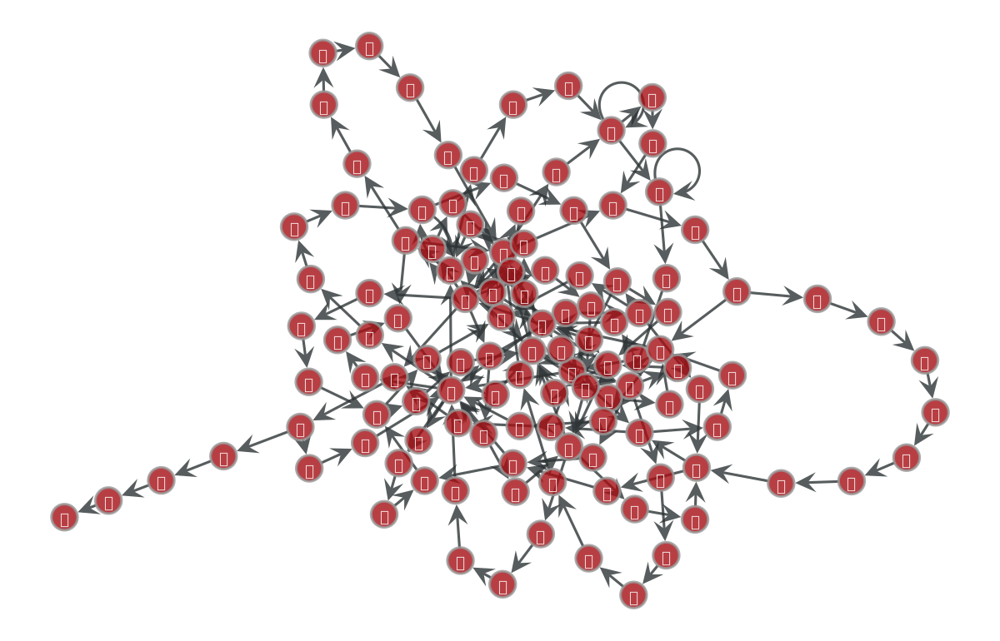

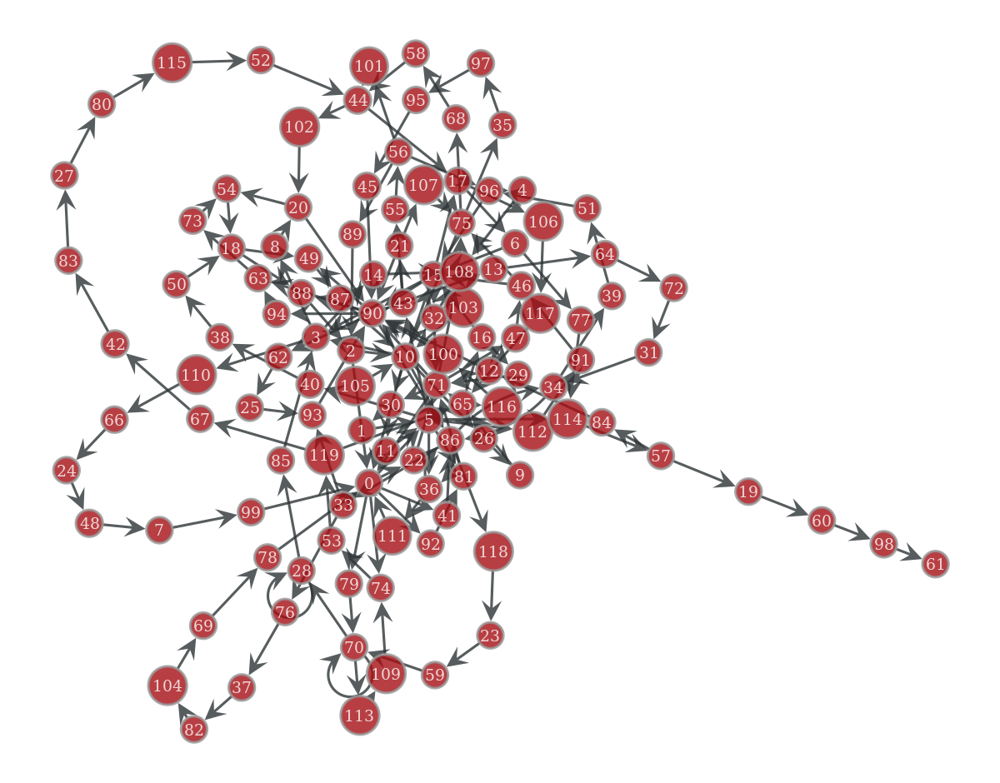

Trophic Incoherence
0.9068374531511687
Trophic Levels
[ 0.         -0.27161688 -0.02886831 -0.00482079 -0.05891257 -0.28823287
 -0.45797037 -0.00137737  0.22389618 -0.37068195 -0.25360688 -0.27161688
  0.236223    0.17219978  0.11169895 -0.13395878 -0.66990389 -0.16410975
  0.71937649  1.28293116  0.45261314 -0.44348612 -0.11158146  0.06981258
 -0.00275473  0.2902541  -0.31214442 -0.28377939  0.05917663 -0.4465334
 -0.25500089  0.05019236 -0.376301   -0.51628293  0.00952322 -0.01447924
 -0.05466664 -0.36877352  0.21557181 -0.10899913 -0.03633053  0.02422491
 -0.51965399 -0.28592609  0.1879698   0.15603188 -0.14574146 -0.18445219
 -0.00206605  0.72217679  0.46747415 -0.22752147  0.0700325  -0.19977498
  1.05339599 -0.62485427 -0.96378245  0.28293116  0.10154111  0.08049396
  2.28293116  4.28293116  0.25156151  0.92300068  0.13153064 -0.42921949
 -0.00344342 -0.63759129  0.01511241 -0.14750941  0.09117534 -0.22316291
  0.0908615   0.98819834  0.35597863 -0.07131628 -0.44252822 -0.0758425

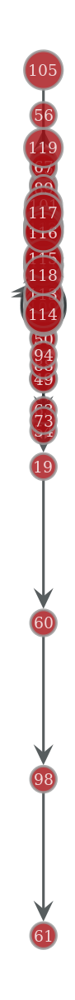

Betweenness Centrality
[0.32567485 0.00413047 0.11873292 0.11724961 0.00875774 0.16442424
 0.04663984 0.04073494 0.03322176 0.0249727  0.20298747 0.00413047
 0.03204672 0.02414186 0.0279817  0.17000037 0.02084224 0.07967763
 0.05768409 0.02478279 0.08567156 0.02515074 0.05114639 0.02070574
 0.04030765 0.01057542 0.02475906 0.04828372 0.04377344 0.00343019
 0.016237   0.02478279 0.0420865  0.11733337 0.0545269  0.02414186
 0.01595214 0.040094   0.01869392 0.02488962 0.01848027 0.01370887
 0.04785643 0.08053052 0.09057352 0.02478279 0.04155391 0.01293653
 0.04052129 0.0467231  0.01890756 0.02510326 0.04892465 0.10741585
 0.03015952 0.04740371 0.04761735 0.06466315 0.01450411 0.02091938
 0.01666429 0.         0.01036177 0.02350093 0.0243555  0.11906542
 0.040094   0.04764279 0.01429046 0.04073494 0.07337511 0.20301053
 0.02456915 0.02371457 0.1072022  0.10498945 0.03988036 0.00930542
 0.04094858 0.04383872 0.04849737 0.01671177 0.04030765 0.04807008
 0.03183307 0.04398709 0.18596676 0.046

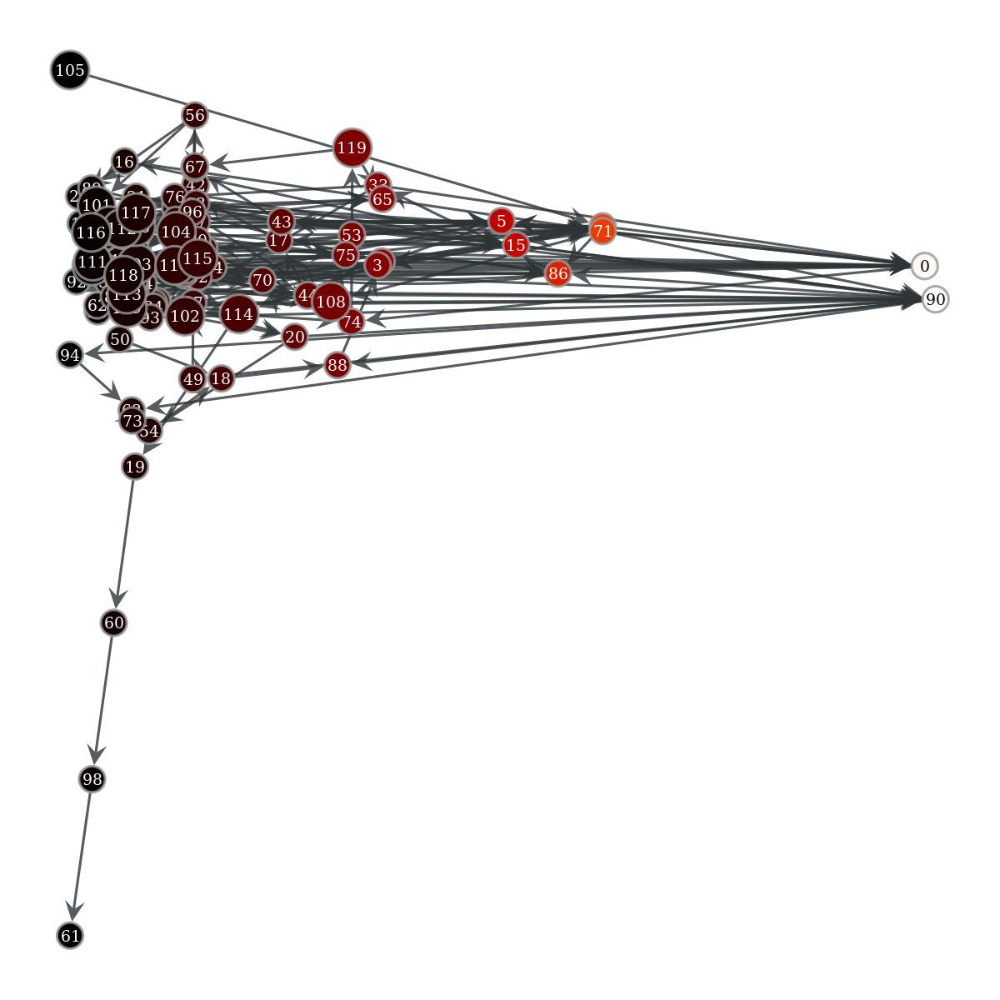

Closeness Centrality
[0.20884956 0.16457462 0.21299639 0.15445026 0.15128205 0.19568823
 0.18759936 0.15147625 0.14372716 0.17744361 0.24229979 0.16457462
 0.1654979  0.1        0.1505102  0.21851852 0.19471947 0.16298343
 0.15344603 0.5        0.16643159 0.17797888 0.19218241 0.09974641
 0.11883182 0.14165666 0.15186615 0.10016978 0.12016293 0.19376026
 0.14285714 0.13882353 0.20068027 0.19063005 0.15945946 0.11313519
 0.16298343 0.10630631 0.11907164 0.13768961 0.10707804 0.1495564
 0.0853835  0.15902965 0.15324675 0.1654979  0.19831933 0.16643159
 0.13318284 0.16503497 0.13409091 0.15838926 0.1353211  0.16010855
 0.13409091 0.15384615 0.18042813 0.13154961 0.13409091 0.10976744
 0.66666667 0.         0.12447257 0.10727273 0.11028037 0.21338156
 0.10727273 0.07951482 0.11919192 0.15070243 0.12202689 0.23694779
 0.12291667 0.11919192 0.13882353 0.21033868 0.09680066 0.1059246
 0.17507418 0.10966543 0.10966543 0.19218241 0.11788212 0.0921875
 0.14337789 0.13516609 0.17507418 0.19633943

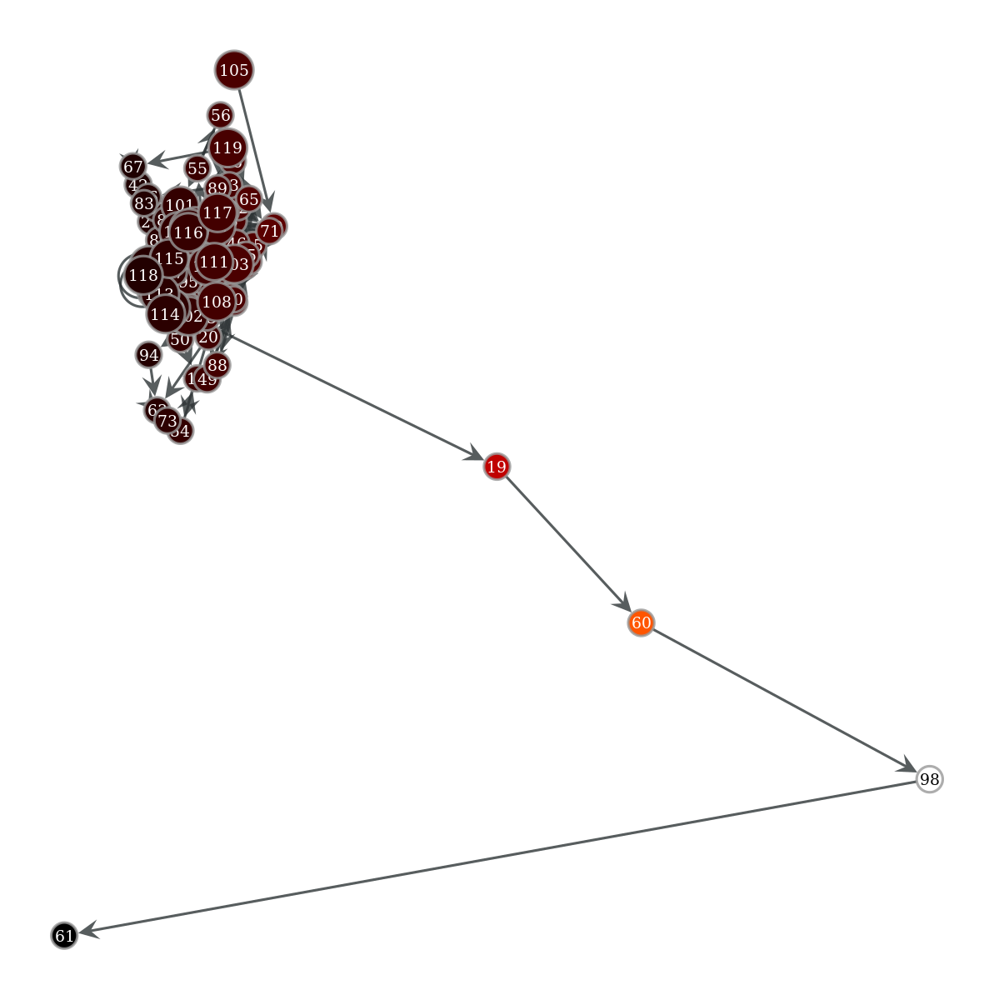

Local Clustering Coeffient
[0.03846154 0.         0.16666667 0.06666667 0.         0.04444444
 0.33333333 0.         0.         0.         0.03636364 0.
 0.         0.         0.         0.05555556 0.         0.16666667
 0.         0.         0.         0.33333333 1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.33333333 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.16666667 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.33333333 0.         0.
 0.         0.         0.         0.         0.         0.07272727
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.33333333 0.         0.
 0.         0.         0.         0.         0.         0.
 0.01666667 0.         0.         0.         1.         0.
 0.  

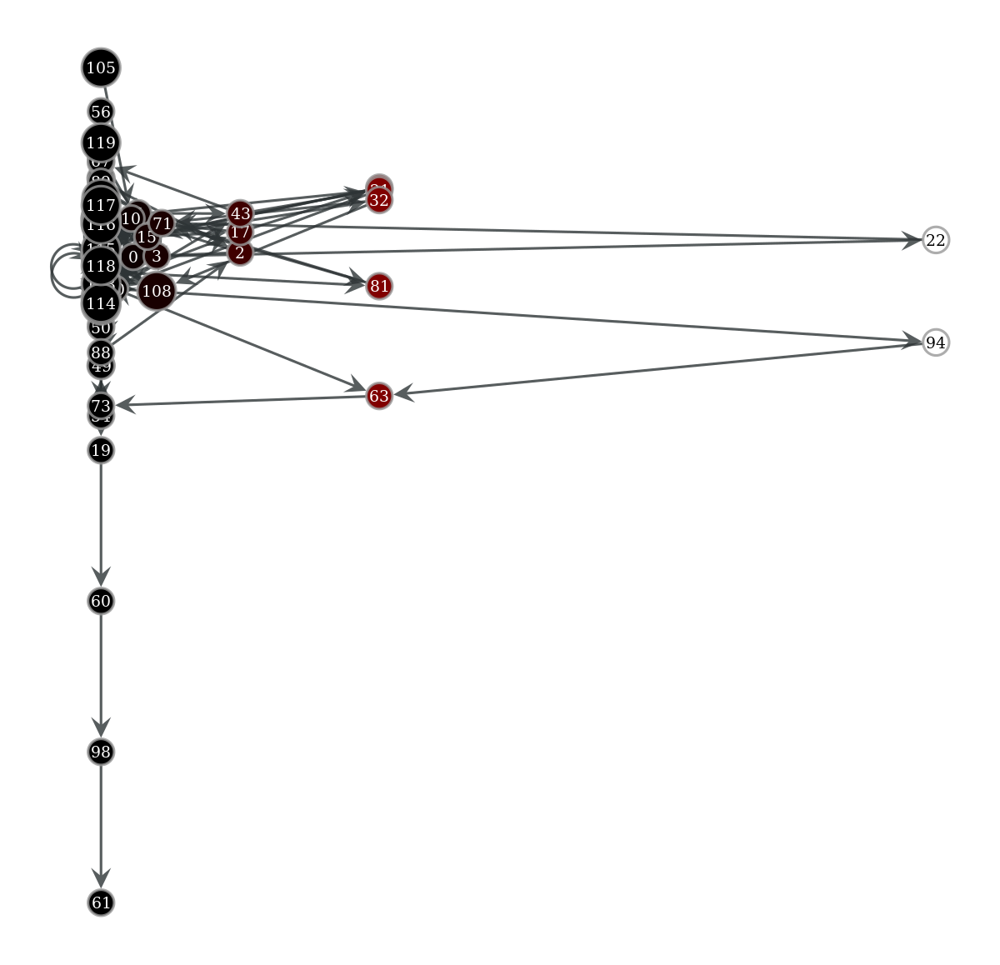

Page Rank
[0.03262988 0.00509915 0.01478001 0.01437179 0.00488739 0.01798309
 0.00621591 0.00692037 0.00536487 0.0060162  0.03009875 0.00509915
 0.00506506 0.0053312  0.00536487 0.01822315 0.00597471 0.01158366
 0.01825663 0.00443788 0.01240753 0.00464135 0.00591543 0.00662191
 0.00626791 0.00582438 0.00555686 0.0069004  0.01063964 0.00383212
 0.00895596 0.00659991 0.00516529 0.00626947 0.0118794  0.00542668
 0.00881707 0.00390169 0.00455726 0.00634161 0.00384047 0.00591543
 0.00624026 0.0078788  0.01510207 0.00665855 0.00915471 0.00469197
 0.00662059 0.01309027 0.00516654 0.00668322 0.0075636  0.01101218
 0.01479081 0.00464135 0.00523801 0.00740003 0.00590554 0.00692148
 0.00506506 0.00605131 0.0053312  0.00986272 0.00582438 0.01652417
 0.005853   0.00582047 0.00542668 0.00572202 0.01702918 0.02399368
 0.00624359 0.00967617 0.01143447 0.01458992 0.00306921 0.00393463
 0.00615658 0.00591543 0.00715819 0.00886859 0.0046093  0.0065971
 0.00443788 0.00581471 0.02341931 0.01241958 0.013090

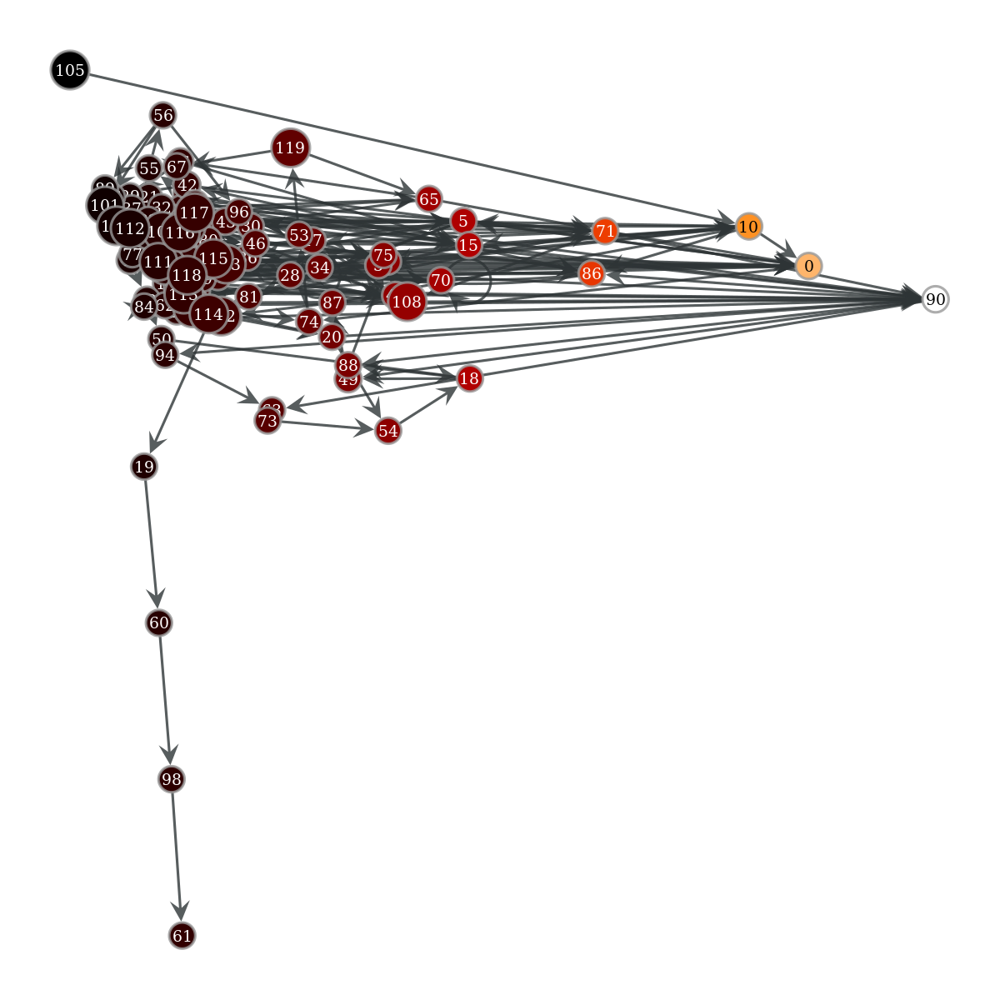

In [ ]:
from graph_tool.inference.util import float16
from graph_tool.all import *
import math
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import string
import re
from scipy import sparse
from scipy.linalg import lu_factor, lu_solve
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import inv

# String.puncuation = !"#$%&'()*+,-./:;<=>?@[\]^_`{|}~
remPunc = string.punctuation
remPunc = remPunc.replace("!","")
remPunc = remPunc.replace(".","")
remPunc = remPunc.replace("?","")
remPunc = remPunc + "，：；、"


text = "以前，有个国王和王后一直没有孩子，他们为此非常伤心苦恼。有一天，王后正在河边散步，一条小鱼把头浮出水面对她说：你的愿望就会实现了，不久你就会生下一个女儿的。过了一段时间，那条小鱼所预言的情况真的实现了，王后真的生下了一个非常漂亮的女儿。国王高兴得时时刻刻爱不释手，决定举行一个大型宴会。他不仅邀请了他的亲戚、朋友和外宾，而且邀来了几乎所有的女巫师，让她们为他的女儿送来善良美好的祝愿。他的王国里一共有十三个女巫师，而他只有十二个金盘子来招待她们进餐，所以他只邀请了十二个女巫师，留下一个没有邀请。"
table = str.maketrans(dict.fromkeys(remPunc))
text_nopunc = text.translate(table)

words = list(''.join(re.findall(r"[\w']+|[.,!?;。！，：；？、]", text_nopunc.lower())))

words_table = str.maketrans(dict.fromkeys((string.punctuation + "。！，：；？、")))
words_table_nopunc = list(text.translate(words_table))

#new_text = text_nopunc.lower()
#print(new_text)
print(words)
print(words_table_nopunc)

#words = new_text.split()
#print(words)

values, counts = np.unique(words_table_nopunc, return_counts=True)
print(counts)
print(values)

N = len(values)
adj = np.zeros( (N, N) )
for i in range(len(values)):
    for j in range(len(values)):
        for z in range(len(words)-1):
            if words[z] == values[i] and words[z+1] == values[j]:
                adj[i][j] += 1
                break;

np.set_printoptions(threshold=np.inf)
#print(adj)

g = Graph()
g.set_directed( True )

edge_weights = g.new_edge_property("double")
g.edge_properties["weight"] = edge_weights
vertex_labels = g.new_vertex_property("string")
g.vertex_properties["labels"] = vertex_labels

v = [ g.add_vertex() for i in range(N) ]
for i in range(N):
    vertex_labels[v[i]] = values[i]
    for j in range(N):
        if adj[i][j] != 0:
            e = g.add_edge( v[i], v[j] )
            edge_weights[e] = adj[i,j]

in_degs = (g.get_in_degrees(g.get_vertices()))
out_degs = (g.get_out_degrees(g.get_vertices()))
imbalance = np.array(in_degs.astype(float) - out_degs.astype(float))
strength = in_degs + out_degs
adjacency = graph_tool.spectral.adjacency(g, weight=edge_weights, vindex=None, operator=False, csr=True).transpose()

laplacian = np.diag(strength) - (adjacency + adjacency.transpose())

graph_draw(g, vertex_text=vertex_labels)
graph_draw(g, vertex_text=g.vertex_index)
#ax1.set_xlim([-35, 35])
#ax1.set_ylim([-40, 40])

remLapl = np.delete((np.delete(laplacian, (0), axis=0)), (0), axis=1)
remImb = np.delete(imbalance, (0), axis=0)

lu, piv = lu_factor(remLapl)
h = lu_solve((lu, piv), remImb)
h2 = np.insert(h, 0, 0, axis=0)

print("Trophic Incoherence")
top = 0
bottom = 0
for i in range(g.num_vertices()):
  for j in range(g.num_vertices()):
    top += (adj[i,j])*((h2[j]-h2[i]-1)**2)
    bottom += adj[i,j]
print(top/bottom)

pos1 = g.new_vertex_property("vector<double>")
print("Trophic Levels")
np.set_printoptions(suppress=True)

def normalise(arr, t_min, t_max):
    norm_arr = []
    diff = t_max - t_min
    diff_arr = max(arr) - min(arr)   
    for i in arr:
        temp = (((i - min(arr))*diff)/diff_arr) + t_min
        norm_arr.append(temp)
    return norm_arr

normtc = normalise(h2, 0, 10)
print(h2)
print(normtc)
for i in range(len(g.get_vertices())):
    pos1[g.vertex(i)] = (0, normtc[i])

graph_draw(g, pos=pos1, vertex_text=g.vertex_index)

vp, ep = graph_tool.centrality.betweenness(g)
pos2 = g.new_vertex_property("vector<double>")
print("Betweenness Centrality")
print(vp.get_array())
normvp = normalise(vp, 0, 10)
print(normvp)
for i in range(len(g.get_vertices())):
    pos2[g.vertex(i)] = (normvp[i], normtc[i])

graph_draw(g, pos=pos2, vertex_text=g.vertex_index, vertex_fill_color=vp, vcmap=matplotlib.cm.gist_heat)

cp = graph_tool.centrality.closeness(g)
print("Closeness Centrality")
for i in range(len(g.get_vertices())):
  if (np.isnan(cp[i])):
    cp [i] = 0
print(cp.get_array())
normcp = normalise(cp, 0, 10)
print(normcp)
pos3 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
  pos3[g.vertex(i)] = (normcp[i], normtc[i])

graph_draw(g, pos=pos3, vertex_text=g.vertex_index, vertex_fill_color=cp, vcmap=matplotlib.cm.gist_heat)

lc = local_clustering(g)
pos4 = g.new_vertex_property("vector<double>")
print("Local Clustering Coeffient")
print(lc.get_array())
normlc = normalise(lc, 0, 10)
print(normlc)
for i in range(len(g.get_vertices())):
    pos4[g.vertex(i)] = (normlc[i], normtc[i])

graph_draw(g, pos=pos4, vertex_text=g.vertex_index, vertex_fill_color=lc, vcmap=matplotlib.cm.gist_heat)

pr = pagerank(g)
pos5 = g.new_vertex_property("vector<double>")
print("Page Rank")
print(pr.get_array())
normpr = normalise(pr, 0, 10)
print(normpr)
for i in range(len(g.get_vertices())):
    pos5[g.vertex(i)] = (normpr[i], normtc[i])

graph_draw(g, pos=pos5, vertex_text=g.vertex_index, vertex_fill_color=pr, vcmap=matplotlib.cm.gist_heat)

%matplotlib inline
plt.show()